In [1]:
import scanpy as sc
import anndata as ann
import numpy as np 
import seaborn as sb
import pandas as pd
import pickle
from sklearn import preprocessing as pp
import diffxpy.api as de
import time
from scipy import sparse

import sys  
sys.path.insert(0, '/lustre/groups/ml01/code/karin.hrovatin/mm_pancreas_atlas_rep/code/')
from importlib import reload  
import helper
reload(helper)
import helper as h
from constants import SAVE
import expected_multiplet_rate as emr
reload(emr)
import expected_multiplet_rate as emr
#sc.settings.verbosity = 3

from matplotlib import rcParams
import matplotlib.pyplot as plt

#R interface
import rpy2.rinterface_lib.callbacks
import logging
from rpy2.robjects import pandas2ri
import anndata2ri

rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

In [3]:
%%R
library(scran)
library(biomaRt)
library(BiocParallel)
library(Seurat)

In [4]:
# Path for saving results - last shared folder by all datasets
shared_folder='/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/islet_glpest_lickert/rev7/ref/'
UID2='STZ_ref_annotation'

Load data:

In [7]:
#Load data
#adata=pickle.load(  open( shared_folder+"data_normalised.pkl", "rb" ) )
adata=h.open_h5ad(shared_folder+"data_normalised.h5ad",unique_id2=UID2)

In [8]:
adata

AnnData object with n_obs × n_vars = 7678 × 14060
    obs: 'file', 'n_counts', 'n_genes', 'mt_frac', 'n_counts_filter', 'n_genes_filter', 'mt_frac_filter', 'doublet_score', 'doublet', 'doublet_score_filter', 'size_factors'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'doublet_score_filter_colors', 'file_colors', 'mt_frac_filter_colors', 'n_counts_filter_colors', 'n_genes_filter_colors'
    layers: 'counts'

## Add previously generated annotation

In [9]:
# Add previously generated annotation (Maren Buttner)
#adata_preannotated=h.open_h5ad("/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/salinno_project/rev4/maren/data_endo_final.h5ad",unique_id2=UID2)
adata_preannotated=h.open_h5ad("/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/islet_glpest_lickert/rev7/subarna_study/GSE128565_adata_processed.h5ad.h5",unique_id2=UID2)

In [10]:
adata_preannotated

AnnData object with n_obs × n_vars = 32888 × 18210
    obs: 'percent_mito', 'percent_ribo', 'n_counts', 'n_genes', 'groups', 'treatment', 'groups_named_broad', 'S_score', 'G2M_score', 'phase', 'proliferation', 'proliferation_man', 'doublet_score', 'groups_named_fine', 'groups_named_beta_dpt', 'Ins-Gcg-Sst', 'groups_named_broad_cond'
    var: 'n_cells', 'highly_variable_genes'
    uns: 'groups_named_beta_dpt_colors', 'groups_named_broad_colors', 'groups_named_fine_colors', 'proliferation_colors', 'proliferation_man_colors', 'rank_genes_groups', 'treatment_colors', 'treatment_colors_rgb'
    obsm: 'X_umap'

In [11]:
# Subset preannotated dataset obs and order it to match current dataset
preannotated_obs=adata_preannotated.obs.copy()
preannotated_obs=preannotated_obs.reindex([idx+'_'+adata.obs.at[idx,'file'] for idx in adata.obs.index])

In [12]:
# Add pre-prepared cell type annotation to currently used dataset
# Add 'pre_' before each original annotation
for annotation in ['groups_named_broad','groups_named_fine', 'groups_named_beta_dpt', 'Ins-Gcg-Sst']:
    annotation_new='pre_'+annotation
    # Data was sorted before - remove index as they do not match
    adata.obs[annotation_new]=preannotated_obs[annotation].values
    # Replace np.nan with na
    adata.obs[annotation_new] = adata.obs[annotation_new].cat.add_categories('NA')
    adata.obs[annotation_new].fillna('NA', inplace =True) 
    # Remove unused categories
    adata.obs[annotation_new].cat.remove_unused_categories(inplace=True)

Pre-annotated cell counts

In [13]:
# Count of cells per annotation
for annotation in ['groups_named_broad','groups_named_fine', 'groups_named_beta_dpt', 'Ins-Gcg-Sst']:
    # For some reason the same line above does not remove all categories, thus it is done here again
    adata.obs['pre_'+annotation].cat.remove_unused_categories(inplace=True)
    print('pre_'+annotation,':')
    print(adata.obs['pre_'+annotation].value_counts())

pre_groups_named_broad :
beta            5618
alpha            783
delta            494
polyhormonal     381
NA               341
PP                61
Name: pre_groups_named_broad, dtype: int64
pre_groups_named_fine :
Ins_1                   5341
Gcg                      783
Sst-Ppy_low              494
NA                       341
Ins_2                    272
Ins-Sst-Ppy              184
Ins-Ppy                  139
Ppy                       61
Gcg-Ppy_high              43
Gcg-Ppy_low               15
Ins_dedifferentiated       5
Name: pre_groups_named_fine, dtype: int64
pre_groups_named_beta_dpt :
Ins_1                   5314
Gcg                      783
Sst-Ppy_low              494
NA                       341
Ins_2                    272
Ins-Sst-Ppy              184
Ins-Ppy                  139
Ppy                       61
Gcg-Ppy_high              43
Ins_3                     27
Gcg-Ppy_low               15
Ins_dedifferentiated       5
Name: pre_groups_named_beta_dpt, dtype: int64

In [14]:
# Set one annotation column to pre_cell_type to enable below code to work
adata.obs.rename(columns={'pre_groups_named_beta_dpt':'pre_cell_type'}, inplace=True)

## Visualisation

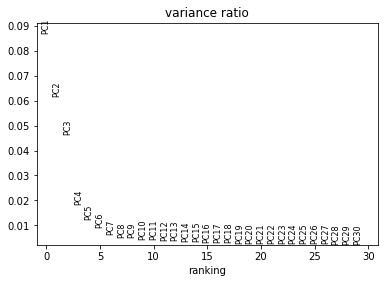

In [15]:
sc.pp.pca(adata, n_comps=30, use_highly_variable=True, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata)

In [16]:
# Select number of PCs to use
N_PCS=10

Compare different embeddings based on previously defined annotation. 

In [17]:
#sc.pp.neighbors(adata,n_pcs = N_PCS,metric='correlation') 
#sc.tl.umap(adata)

In [18]:
#rcParams['figure.figsize']=(7,7)
#sc.pl.umap(adata,size=10,color=['pre_cell_type'])
#sc.pl.umap(adata,size=10,color=['file'])

In [19]:
sc.pp.neighbors(adata,n_pcs = N_PCS) 
sc.tl.umap(adata)

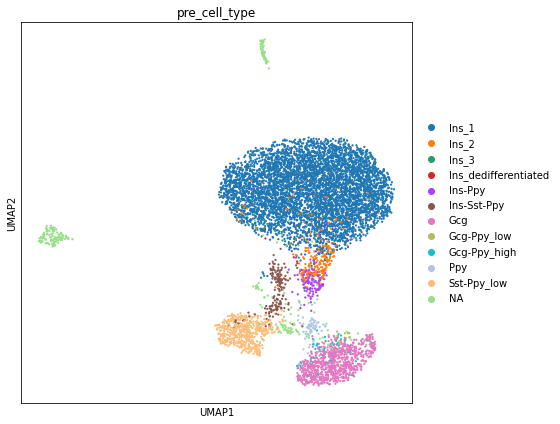

In [20]:
rcParams['figure.figsize']=(7,7)
sc.pl.umap(adata,size=20,color=['pre_cell_type'])
#sc.pl.umap(adata,size=10,color=['file'])

#C: Decided that Euclidean distance (default) will be ok.

## Cell cycle
Performed separately for individual batches.

### Seurat/Scanpy - score by G2M and S

In [21]:
# Load mouse cell cycle genes
cell_cycle_mm=pd.read_table('/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/gene_lists/cell_cycle_mm_Macosko2015.tsv',sep='\t')

Use cell cycle genes that overlap HVGs (from different batches). Display these genes on HVG plots (with non-phase genes being marked as .NA).

Use G2/M and M gene sets for G2/M annotation and S gene set for S annotation.

G1/S N genes: 92 overlap var: 84 overlap hvg (all): 6
S N genes: 96 overlap var: 88 overlap hvg (all): 11
G2/M N genes: 127 overlap var: 107 overlap hvg (all): 27
M N genes: 143 overlap var: 126 overlap hvg (all): 26
M/G1 N genes: 108 overlap var: 102 overlap hvg (all): 11
N genes for scoring S: 11 and G2/M: 53


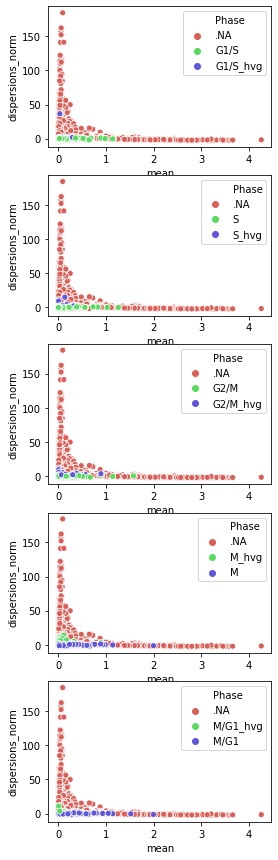

In [22]:
# How many of the cell cycle phase genes are present in HVG and in var and how variable they are
hvg=set(adata.var_names[adata.var.highly_variable])
i=0
rcParams['figure.figsize']=(4,15)
fig,axs=plt.subplots(5)
s_hvg=[]
g2m_hvg=[]
for phase in cell_cycle_mm.Phase.unique():
    genes_phase = set(cell_cycle_mm.query('Phase =="'+phase+'"').Gene)
    overlap_var = set(adata.var_names) & genes_phase
    overlap_hvg = hvg & genes_phase
    print(phase,'N genes:',len(genes_phase),'overlap var:',len(overlap_var),'overlap hvg (all):',len(overlap_hvg))
    phase_df=pd.DataFrame([phase]*len(overlap_var),index=overlap_var,columns=['Phase']).reindex(adata.var_names).fillna('.NA').sort_values('Phase')
    phase_df.loc[overlap_hvg,'Phase']=phase+'_hvg'
    phase_df['mean']=adata.var.means
    phase_df['dispersions_norm']=adata.var.dispersions_norm
    sb.scatterplot(x="mean", y="dispersions_norm", hue="Phase",data=phase_df,ax=axs[i],palette='hls')
    i+=1
    if phase == 'S':
        s_hvg.extend(overlap_hvg)
    if phase in ['G2/M','M']:
        g2m_hvg.extend(overlap_hvg)
        
print('N genes for scoring S:',len(s_hvg),'and G2/M:',len(g2m_hvg))

Cell cycle annotation

In [23]:
# Annotated cell cycle per batch
adata.obs['S_score']= np.zeros(adata.shape[0])
adata.obs['G2M_score'] = np.zeros(adata.shape[0])
adata.obs['phase'] = np.zeros(adata.shape[0])

for batch in enumerate(adata.obs['file'].cat.categories):
    batch=batch[1]
    idx = adata.obs.query('file=="'+batch+'"').index
    adata_tmp = adata[idx,:].copy()
    sc.tl.score_genes_cell_cycle(adata_tmp, s_genes=s_hvg, g2m_genes=g2m_hvg,use_raw=False)
    adata.obs.loc[idx,'S_score'] = adata_tmp.obs['S_score']
    adata.obs.loc[idx,'G2M_score'] = adata_tmp.obs['G2M_score']
    adata.obs.loc[idx,'phase'] = adata_tmp.obs['phase']
    
del adata_tmp

In [24]:
# Count of cells annotated to each phase
adata.obs['phase'].value_counts()

G1     4136
S      3268
G2M     274
Name: phase, dtype: int64

Display cell cycle score distributions and annotation.

... storing 'phase' as categorical


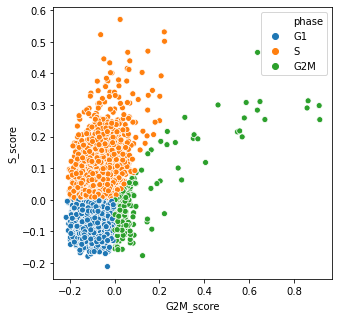

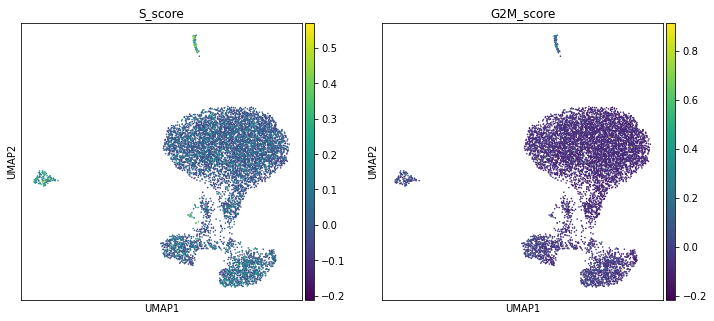

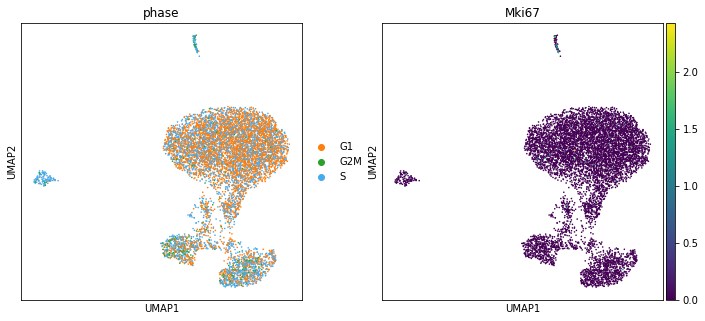

In [25]:
adata.uns['phase_colors']=['#ff7f0e', '#2ca02c','#46aaf0']

rcParams['figure.figsize']=(5,5)
sb.scatterplot(x='G2M_score',y='S_score',hue='phase',data=adata.obs)
sc.pl.umap(adata, color=['S_score', 'G2M_score'], size=10, use_raw=False)
sc.pl.umap(adata, color=['phase','Mki67'], size=10, use_raw=False)

#C: Many cells were annotated as cycling, however, they do not express Mki67 very strongly.

 ### Cyclone - based on G1, S, and G2/M scores

Add gene Entrez IDs to adata in order to map genes to cell cycle database.

In [26]:
# Adata genes for R
genes=adata.var_names

In [27]:
%%R -i genes -o gene_ids
# Extract Ensembl gene IDs
mouse = useMart("ensembl", dataset = "mmusculus_gene_ensembl")
gene_ids = getBM(attributes = c("mgi_symbol",'ensembl_gene_id'), filters = "mgi_symbol", values = genes , mart = mouse, uniqueRows=FALSE)

In [28]:
# Add gene ids to adata, use only genes with unique mapped ensembl ids
gene_ids.drop_duplicates(subset='mgi_symbol', keep=False, inplace=True)
gene_ids.index=gene_ids.mgi_symbol
gene_ids=gene_ids.reindex(list(adata.var_names))
adata.var['EID']=gene_ids.ensembl_gene_id

In [29]:
# Prepare R data for cyclonee
x_mat=adata.X.T
gene_ids=adata.var.EID
batches=adata.obs.file
cells=adata.obs.index

In [30]:
%%R -i x_mat -i gene_ids -i batches -i cells -o cyclone_anno
# Cyclone cell scores, calculated separately for each batch
mm.pairs <- readRDS(system.file("exdata", "mouse_cycle_markers.rds", package="scran"))
phases<-c()
s<-c()
g2m<-c()
g1<-c()
cells_order<-c()
for(batch in unique(batches)){
    # Select batch data
    x_mat_batch=x_mat[,batches==batch]
    print(batch,dim(x_mat_batch[1]))
    # Scores
    assignments <- cyclone(x_mat_batch, mm.pairs, gene.names=gene_ids,BPPARAM=MulticoreParam(workers = 16))
    phases<-c(phases,assignments$phases)
    s<-c(s,assignments$score$S)
    g2m<-c(g2m,assignments$score$G2M)
    g1<-c(g1,assignments$score$G1)
    # Save cell order
    cells_order<-c(cells_order,cells[batches==batch])
}
cyclone_anno<-data.frame(phase_cyclone=phases,s_cyclone=s,g2m_cyclone=g2m,g1_cyclone=g1)
rownames(cyclone_anno)<-cells_order

[1] "G1"


In [31]:
# Count of cells annotated to each phase
cyclone_anno.phase_cyclone.value_counts()

G1     7610
G2M      54
S        14
Name: phase_cyclone, dtype: int64

In [32]:
# Add cyclone annotation to adata
cyclone_anno=cyclone_anno.reindex(adata.obs.index)
adata.obs=pd.concat([adata.obs,cyclone_anno],axis=1)

... storing 'phase_cyclone' as categorical
... storing 'EID' as categorical


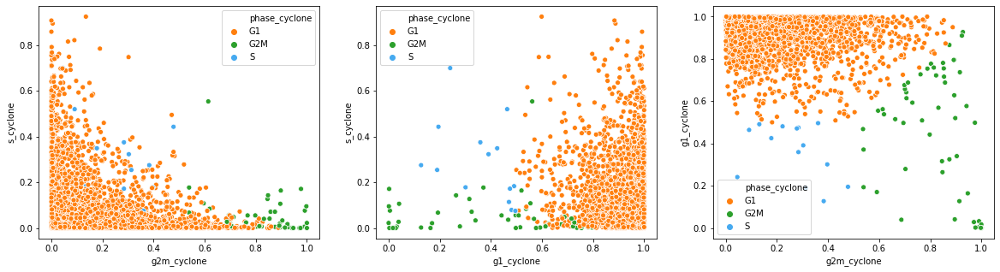

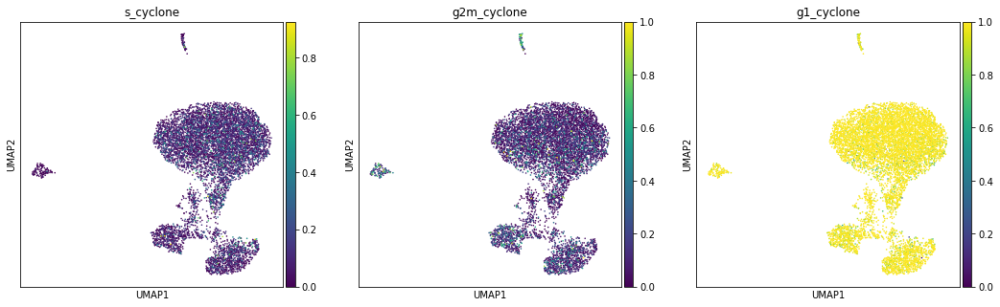

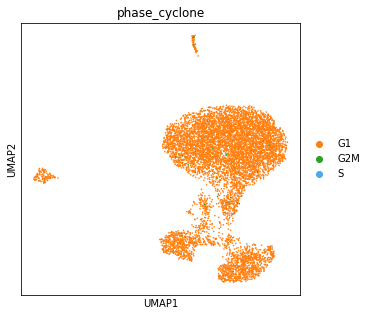

In [33]:
# Plot score distributions and cell assignment on UMAP
rcParams['figure.figsize']=(20,5)
fig,axs=plt.subplots(1,3)
palette=sb.color_palette(['#ff7f0e', '#2ca02c','#46aaf0'])
sb.scatterplot(x='g2m_cyclone',y='s_cyclone',hue='phase_cyclone',data=cyclone_anno,ax=axs[0],palette=palette)
sb.scatterplot(x='g1_cyclone',y='s_cyclone',hue='phase_cyclone',data=cyclone_anno,ax=axs[1],palette=palette)
sb.scatterplot(x='g2m_cyclone',y='g1_cyclone',hue='phase_cyclone',data=cyclone_anno,ax=axs[2],palette=palette)
rcParams['figure.figsize']=(5,5)
sc.pl.umap(adata, color=['s_cyclone', 'g2m_cyclone','g1_cyclone'], size=10, use_raw=False)
adata.uns['phase_cyclone_colors']=['#ff7f0e', '#2ca02c','#46aaf0']
sc.pl.umap(adata, color=['phase_cyclone'], size=10, use_raw=False)

#C: The cyclone results seem more reliable - most cells are not exprected to be involveed in cell cycle and proliferating populations would be expected to cluster separately. Thus, the data is most likely to contain non-proliferating cells.

Check previously annotated profliferation results.

In [34]:
for annotation in ['S_score', 'G2M_score', 'phase', 'proliferation', 'proliferation_man']:
    annotation_new='pre_'+annotation
    # Data was sorted before - remove index as they do not match
    adata.obs[annotation_new]=preannotated_obs[annotation].values
    # Replace np.nan with 'NA' if it is categorical
    if adata.obs[annotation_new].dtype.name=='category':
        adata.obs[annotation_new] = adata.obs[annotation_new].cat.add_categories('NA')
        adata.obs[annotation_new].fillna('NA', inplace =True) 
        # Remove unused categories
        adata.obs[annotation_new].cat.remove_unused_categories(inplace=True)

In [35]:
adata.obs.columns

Index(['file', 'n_counts', 'n_genes', 'mt_frac', 'n_counts_filter',
       'n_genes_filter', 'mt_frac_filter', 'doublet_score', 'doublet',
       'doublet_score_filter', 'size_factors', 'pre_groups_named_broad',
       'pre_groups_named_fine', 'pre_cell_type', 'pre_Ins-Gcg-Sst', 'S_score',
       'G2M_score', 'phase', 'phase_cyclone', 's_cyclone', 'g2m_cyclone',
       'g1_cyclone', 'pre_S_score', 'pre_G2M_score', 'pre_phase',
       'pre_proliferation', 'pre_proliferation_man'],
      dtype='object')

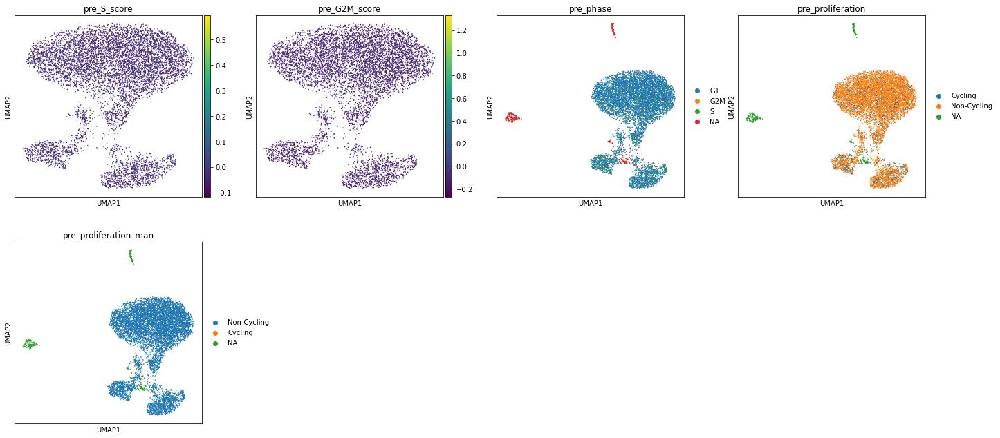

In [36]:
# Non-categorical variables do not show np.nan cells
sc.pl.umap(adata, color=['pre_S_score', 'pre_G2M_score', 'pre_phase',
       'pre_proliferation', 'pre_proliferation_man'], size=10, use_raw=False)

#C: Cyclone results agree more with previous annotation.

## Save intermediate results before cell type annotation

In [37]:
if SAVE:
    h.save_h5ad(adata, shared_folder+"data_annotated.h5ad",unique_id2=UID2)

# Cell type annotation

In [38]:
adata=h.open_h5ad(shared_folder+"data_annotated.h5ad",unique_id2=UID2)

## Clustering

#### Leiden clustering on log transformed data.

In [39]:
res=1

In [40]:
sc.tl.leiden(adata,resolution=res, key_added='leiden_'+str(res))

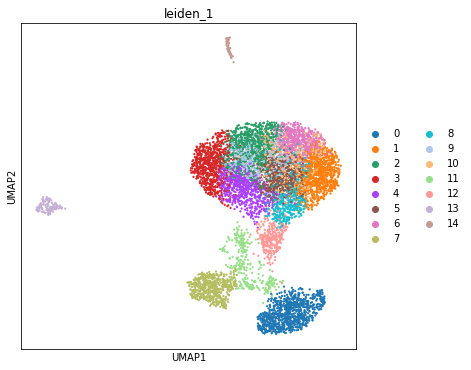

In [41]:
rcParams['figure.figsize']=(6,6)
sc.pl.umap(adata, color=['leiden_'+str(res)] ,size=20, use_raw=False)

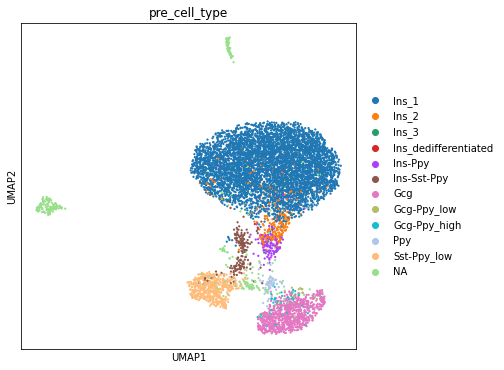

In [42]:
sc.pl.umap(adata, color=['pre_cell_type'] ,size=20, use_raw=False)

#### Seurat style clustering

#C: Not performed as it takes long time to run

#### Leiden clustering on log transformed z-scaled data.

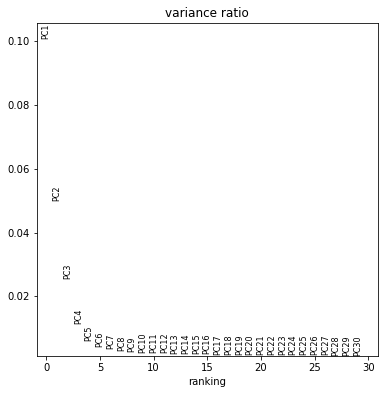

In [8]:
# Scale data and perform PCA
adata_scl=adata.copy()
sc.pp.scale(adata_scl,max_value=10)
sc.pp.pca(adata_scl, n_comps=30, use_highly_variable=True, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata_scl)

In [11]:
#C: Can stay the same as above
N_PCS

10

In [12]:
# neighbours on scaled data
sc.pp.neighbors(adata_scl,n_pcs = N_PCS) 

In [46]:
# This neighbour weight computation (used in  Seurat) does not improve clustering - the main improvement is due to scaling
#snn.shared_knn_adata(adata,n_pcs=N_PCS,n_jobs=8)

In [13]:
# Umap on scaled data
sc.tl.umap(adata_scl)

In [24]:
# Add scaled embedding to adata
adata.obsm['X_umap_scl']=adata_scl.obsm['X_umap']

In [48]:
# Clustering resolution
res=1

In [49]:
# Cluster scaled data
sc.tl.leiden(adata_scl, resolution=res, key_added='leiden_scaled_r'+str(res), directed=True, use_weights=True)

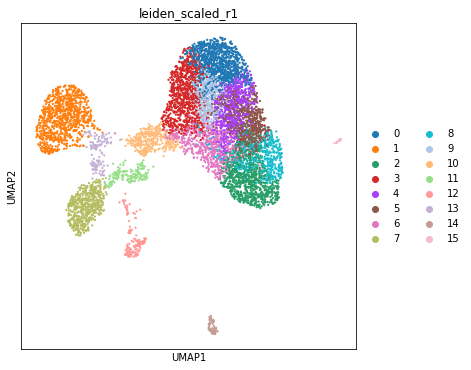

In [50]:
# Compare UMAPs and clusters on scaled data
rcParams['figure.figsize']=(6,6)
sc.pl.umap(adata_scl, color=['leiden_scaled_r'+str(res)] ,size=20, use_raw=False)

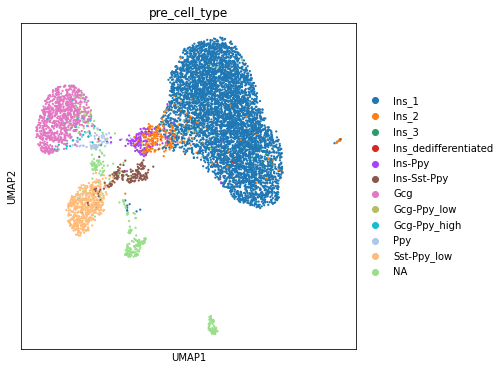

In [51]:
# Reference cell types
sc.pl.umap(adata_scl, color=['pre_cell_type'] ,size=20, use_raw=False)

#C: Umap and clustering on scaled and unscaled data performs similarly. Scaled data is used for consistency with previously analysed Fltp_16 dataset.

#### Per cluster  QC metrics

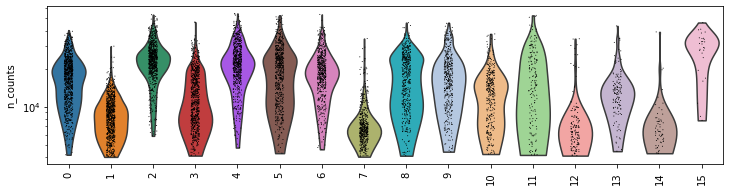

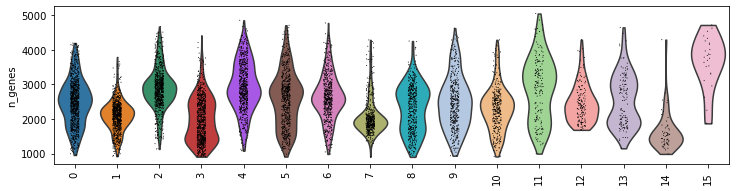

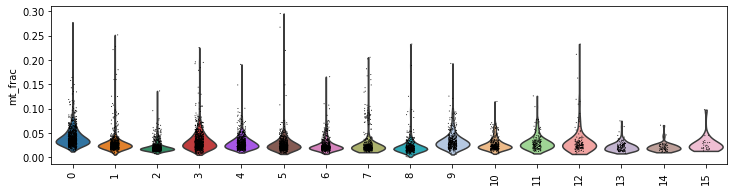

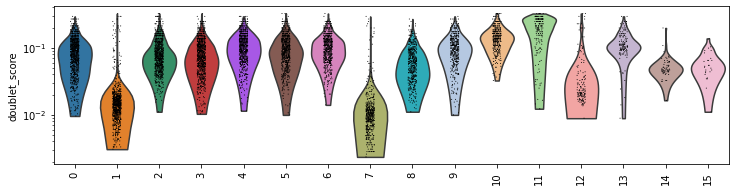

In [52]:
# QC metrics per cell type
# Code for adding info to adata is below
rcParams['figure.figsize']=(10,3)
sc.pl.violin(adata_scl, ['n_counts'], groupby='leiden_scaled_r'+str(res), size=1, log=True,rotation=90)
sc.pl.violin(adata_scl, ['n_genes'], groupby='leiden_scaled_r'+str(res), size=1, log=False,rotation=90)
sc.pl.violin(adata_scl, ['mt_frac'], groupby='leiden_scaled_r'+str(res), size=1, log=False,rotation=90)
sc.pl.violin(adata_scl, 'doublet_score',groupby='leiden_scaled_r'+str(res),size=1, log=True,rotation=90)

## Cell type annotation

In [53]:
# Normalise raw data for plotting and cell type scoring
adata_raw=adata_scl.raw.to_adata().copy()
sc.pp.normalize_total(adata_raw, target_sum=1e4, exclude_highly_expressed=True,inplace=False)
sc.pp.log1p(adata_raw)
adata_rawnormalised=adata_scl.copy()
adata_rawnormalised.raw=adata_raw
del adata_raw

In [5]:
# Markers data
markers=pd.read_excel('/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/gene_lists/markers.xlsx',
                          sheet_name='mice')

In [55]:
# Subset markers to non-immature and non-dedifferentiated for initial annotation
print('Subtypes (original):',markers.Subtype.unique())
remove_subtype=['immature','dedifferentiated']
remove_subtype=[]
markers_filter=markers.query('Subtype not in @remove_subtype')

Subtypes (original): ['mature' 'immature' nan 'dedifferentiated' 'activated' 'quiescent'
 'cytotoxic']


acinar
Missing genes: ['Ptf1a', 'Ce1', 'Rbpj1']


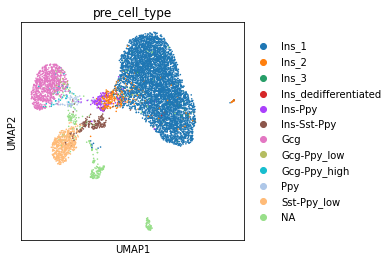

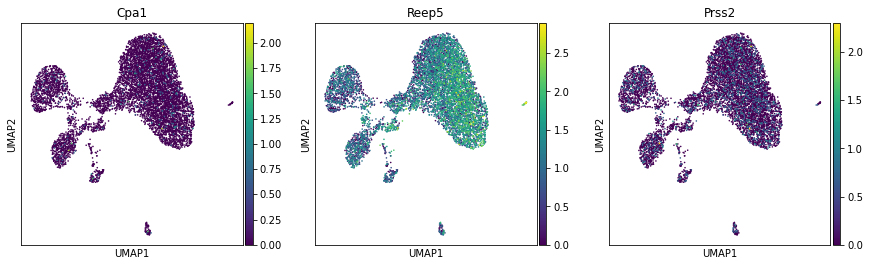

alpha
Missing genes: []


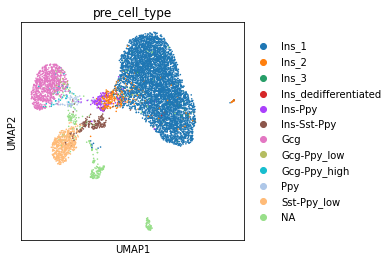

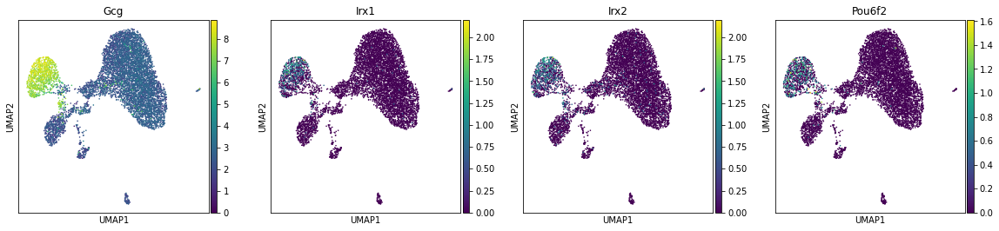

B immune
Missing genes: ['Cd79b']


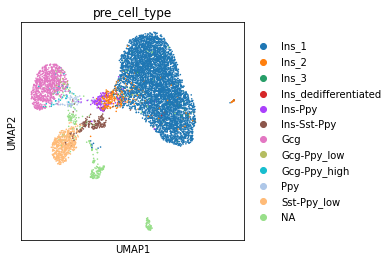

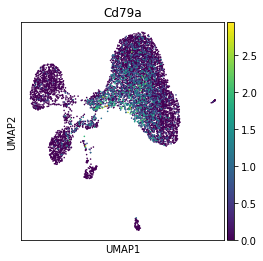

beta
Missing genes: ['Glut2', 'MafA', 'Pax4']


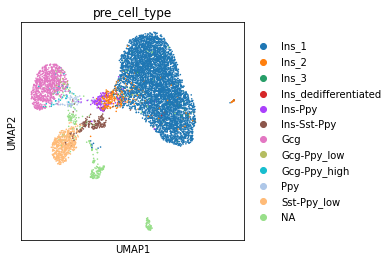

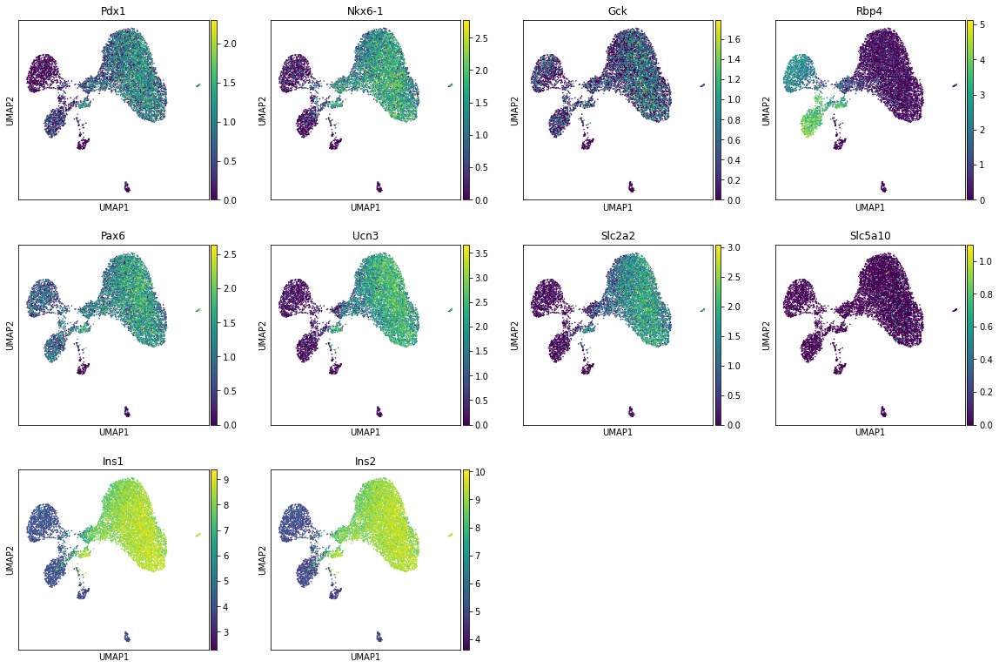

delta
Missing genes: ['Pou3f1']


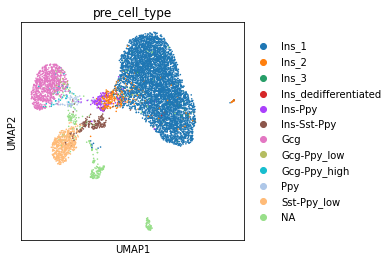

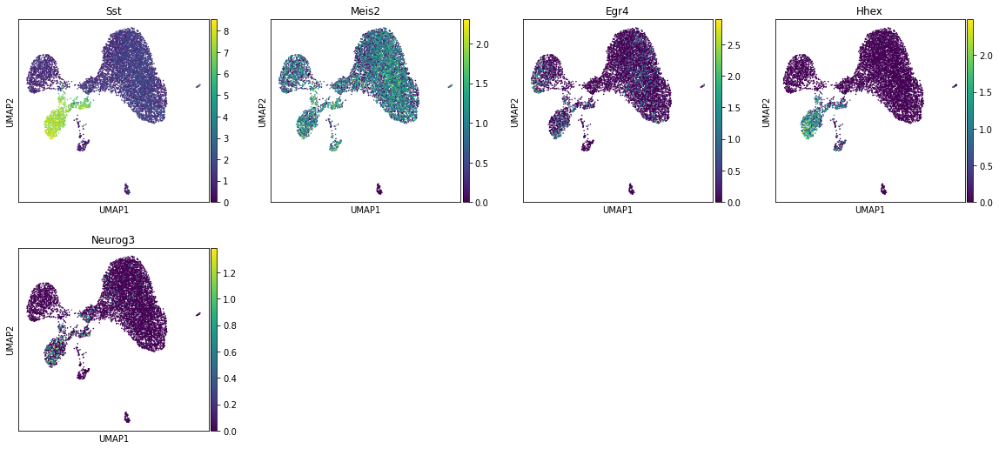

dendritic
Missing genes: ['Iftim3']


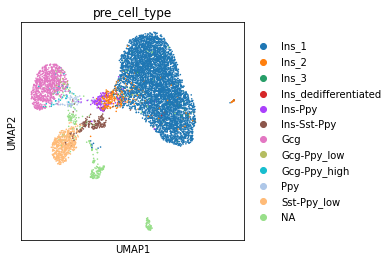

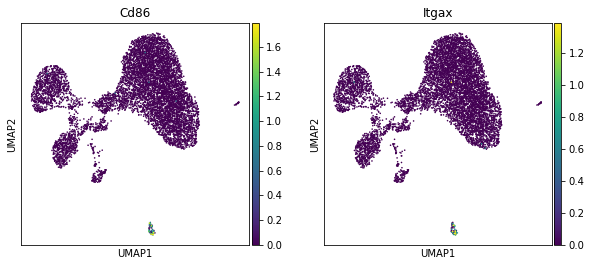

ductal
Missing genes: ['Ca2', 'Pou3f1']


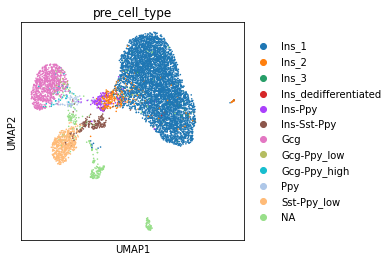

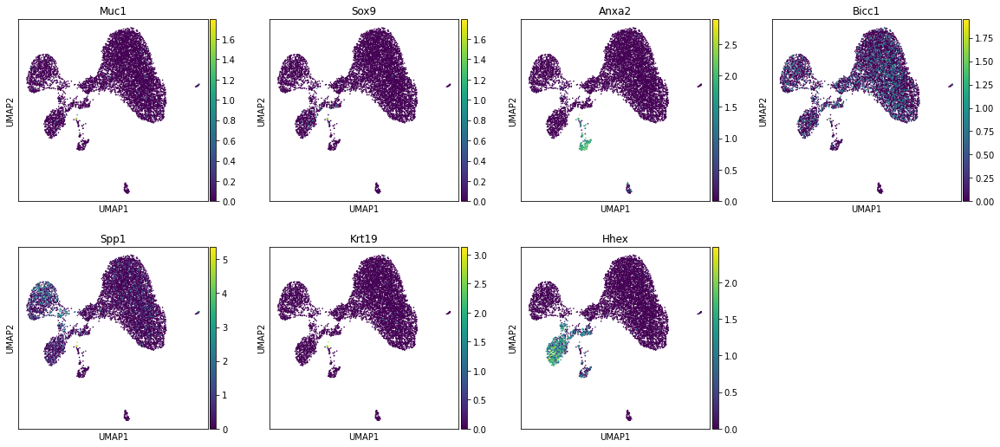

endocrine
Missing genes: ['Neurod2']


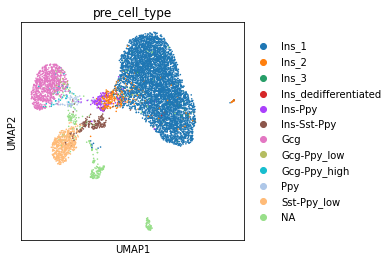

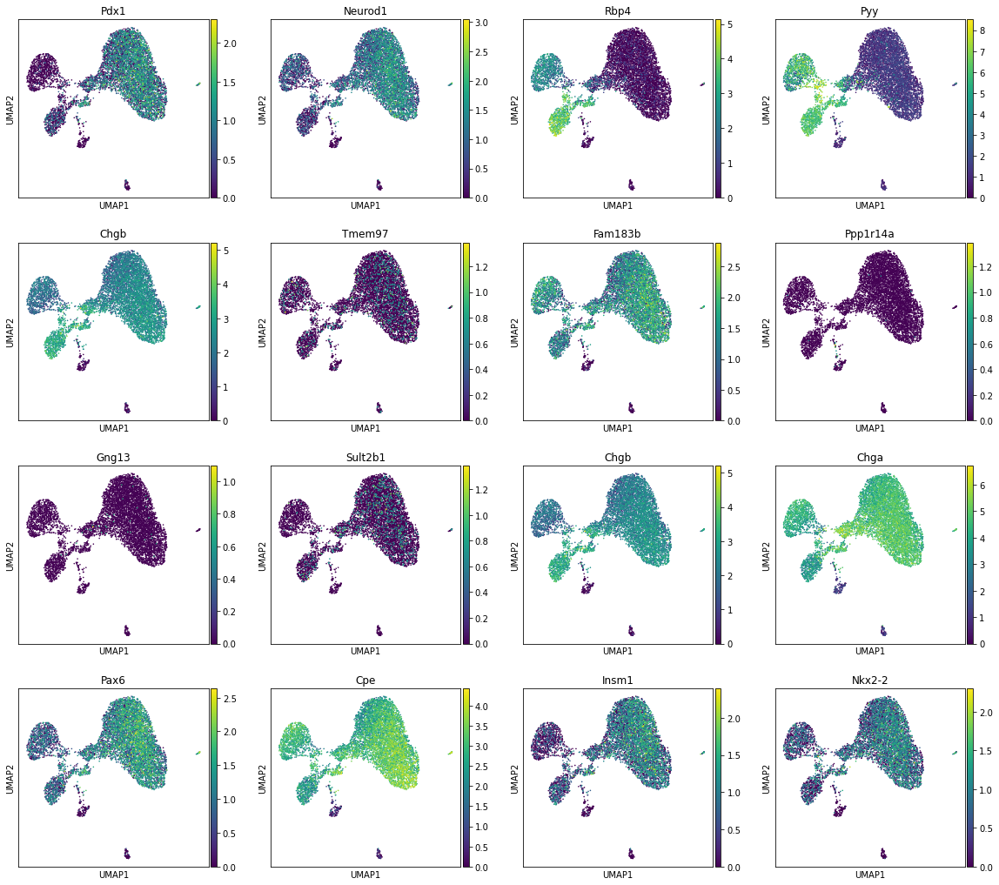

endothelial
Missing genes: []


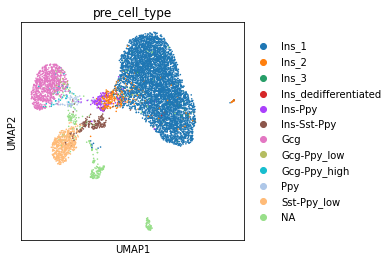

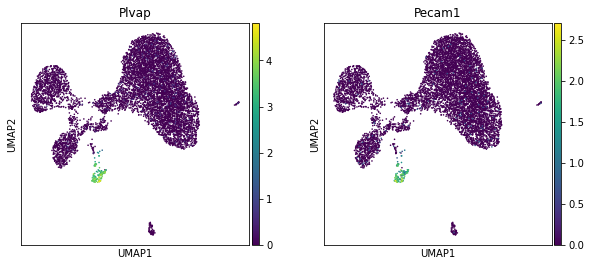

EP
Missing genes: ['Ngn3']


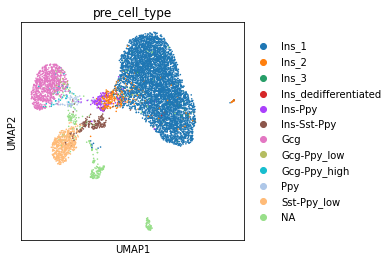

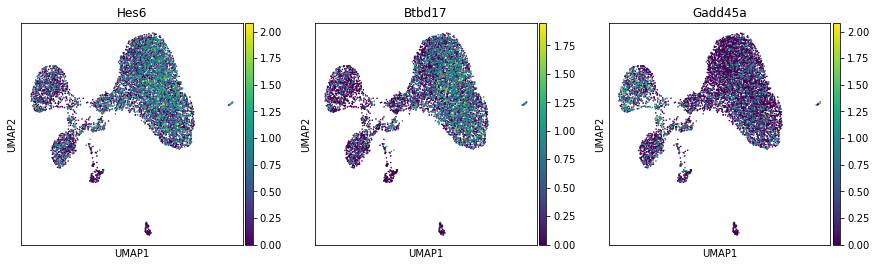

epithelial
Missing genes: []


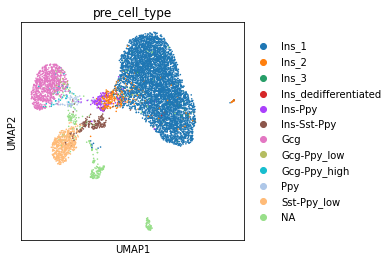

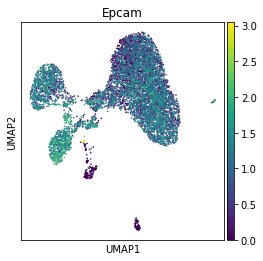

epsilon
No availiable genes (out of: ['Ghrl'] )

gamma
Missing genes: []


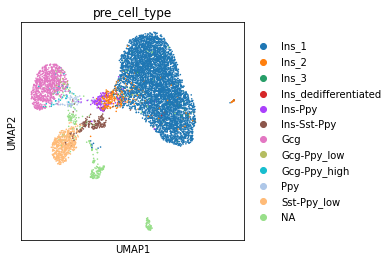

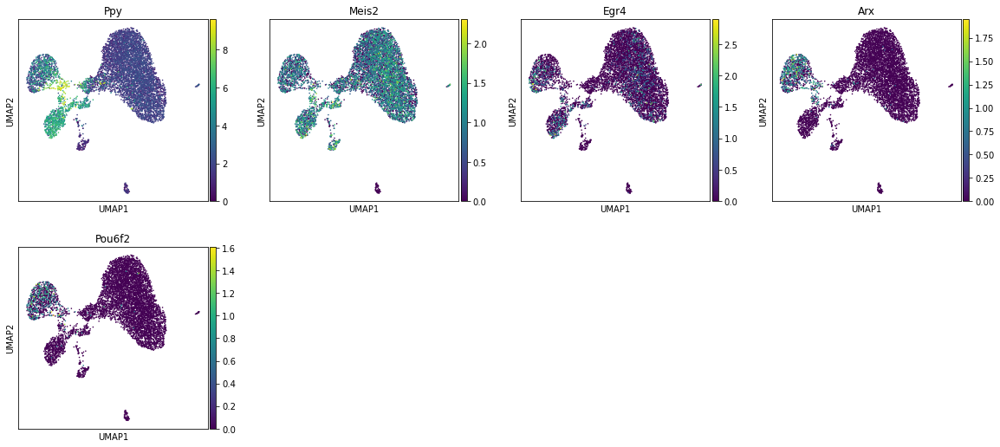

immune
Missing genes: []


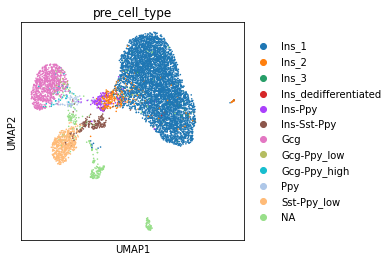

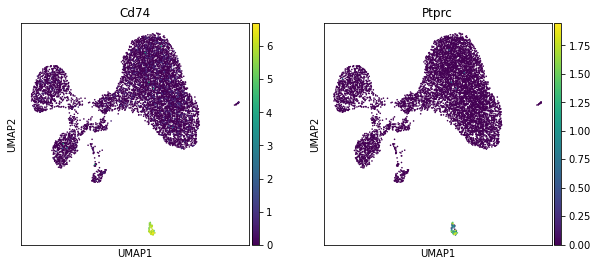

lymphocye
Missing genes: []


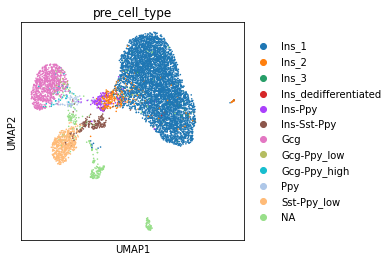

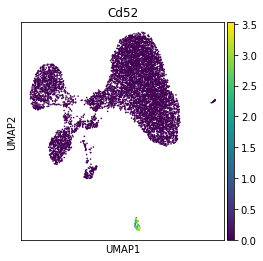

macrophage
Missing genes: []


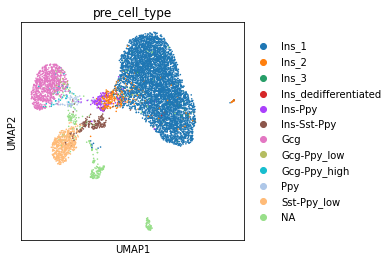

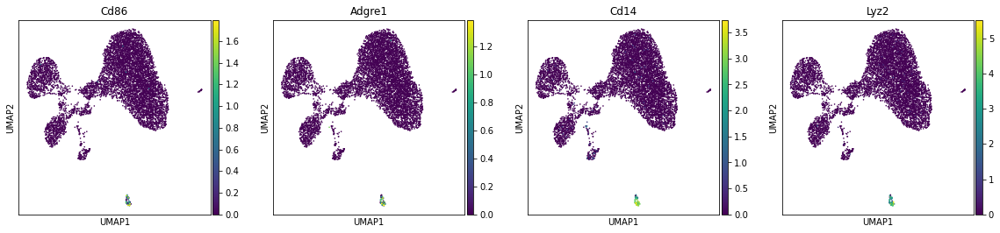

MPC
Missing genes: ['Bft3']


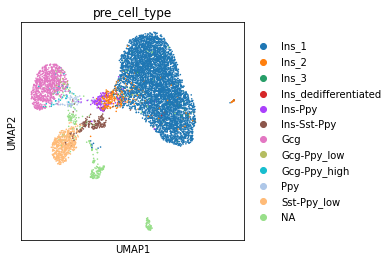

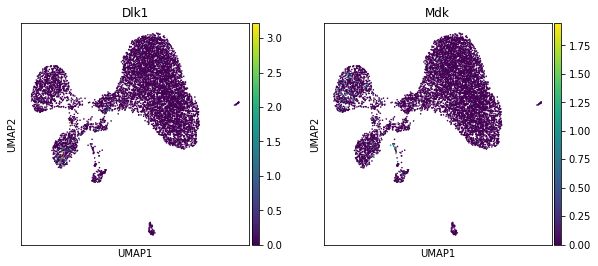

pericyte
Missing genes: ['Cspg4', 'Abcc9']


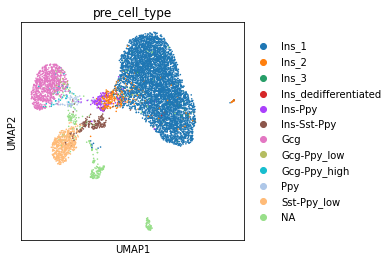

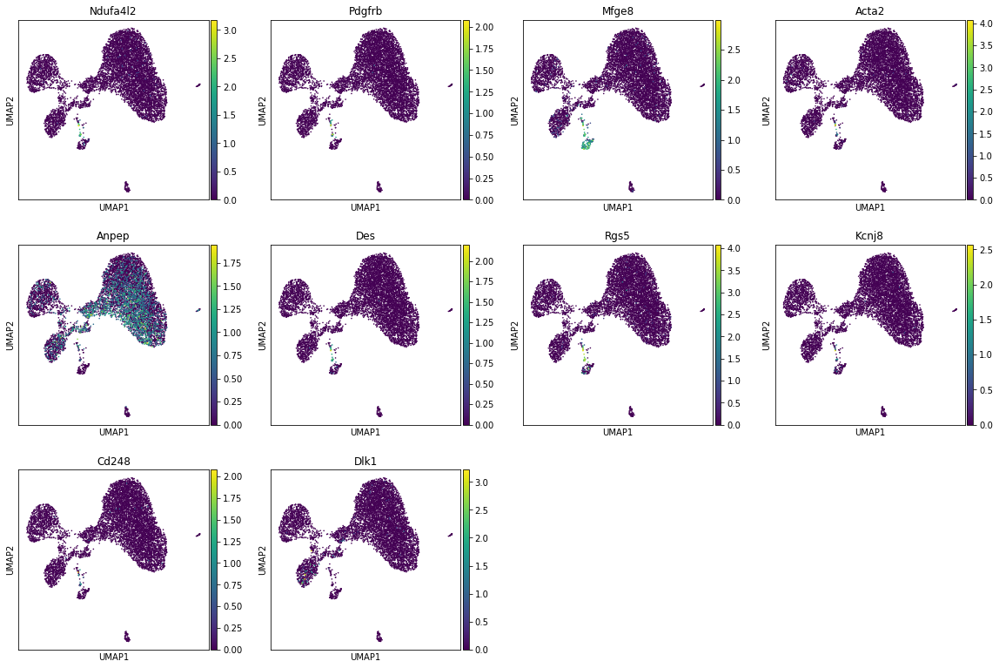

schwann
Missing genes: ['Sox10', 'Cmtm5', 'Ngfr']


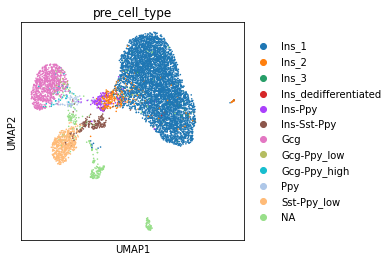

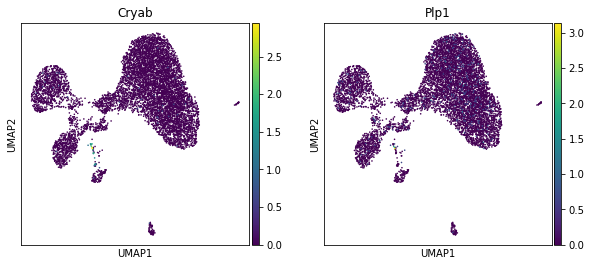

stellate
Missing genes: ['Pdgfra']


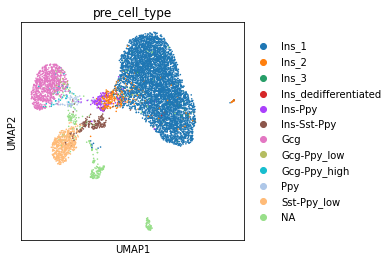

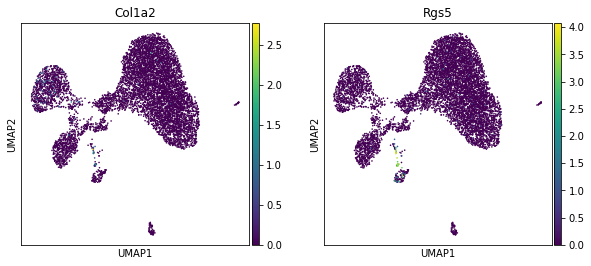

T immune
No availiable genes (out of: ['Cd8a', 'Cd3d', 'Trac'] )

tip
Missing genes: ['Vtn']


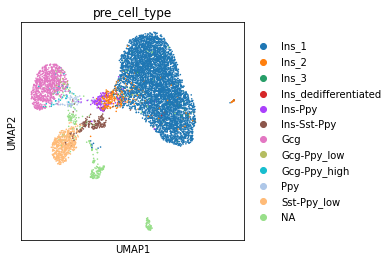

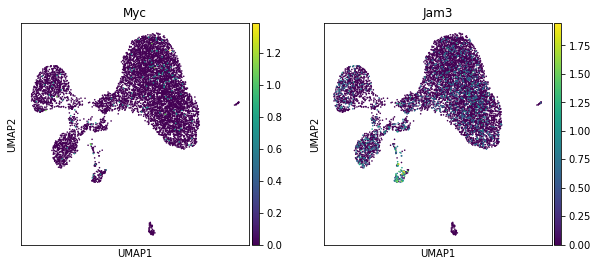

trunk
Missing genes: []


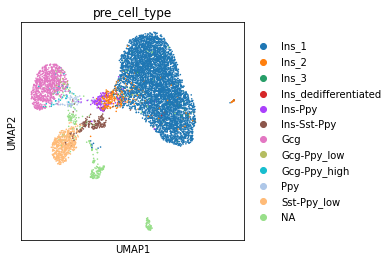

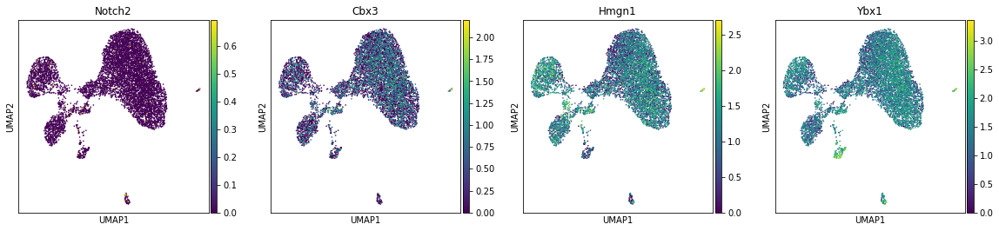

In [56]:
# Plot markers for each cell type
for cell_type in sorted(list(markers_filter.Cell.unique()), key=str.lower):
    print(cell_type)
    genes=list(markers_filter.query('Cell == "'+cell_type+'"').Gene)
    # Retain genes present in raw var_names
    missing=[gene for gene in genes if gene not in adata.raw.var_names]
    genes=[gene for gene in genes if gene in adata.raw.var_names]
    if len(genes)>0:
        print('Missing genes:',missing)
        rcParams['figure.figsize']=(4,4)
        sc.pl.umap(adata_rawnormalised, color=['pre_cell_type'],size=10, use_raw=True)
        sc.pl.umap(adata_rawnormalised, color=genes ,size=10, use_raw=True)
    else:
        print('No availiable genes (out of:',missing,')\n')

#C: Stellate are not used as the usual markers are not present in the data or lowly expressed (could not be destinguished from pericyte). Some other cell types are not used as well as most of the markers are absent.

In [57]:
# Selected markers that seem to be able to distinguish between cell types
# Use only hormone genes for endocrine cells
markers_selection={
'immune':['Cd74','Ptprc','Cd52','Cd14','Lyz2'],
'endothelial':['Plvap','Pecam1'],
'pericyte':['Ndufa4l2','Pdgfrb','Acta2','Des','Rgs5'],
'schwann':['Cryab'],
'alpha':['Gcg'],
'beta':['Ins1','Ins2'],
'delta':['Sst'],
'gamma':['Ppy']
}

### Marker expression scores
Score each cell for marker expression of each cell type. Cells can thus be annotated qith 0 to N cell types. The presence of annotations is then checked for each cluster.

In [58]:
#Score cells for each cell type

# Save score column names 
scores=[]
for cell_type,genes in markers_selection.items():
    score_name=cell_type+'_score'
    scores.append(cell_type+'_score')
    sc.tl.score_genes(adata_rawnormalised, gene_list=genes, score_name=score_name,  use_raw=True)

In [59]:
# Which clusters (column name) to analyse for cell scores
res=1
clusters_col='leiden_scaled_r'+str(res)

In [60]:
# Add cluster information to the used adata
adata_rawnormalised.obs[clusters_col]=adata_scl.obs[clusters_col]

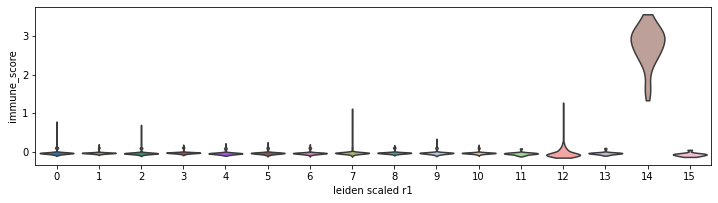

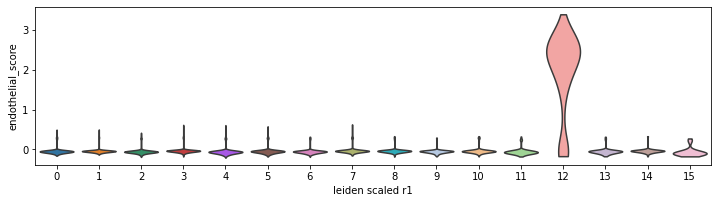

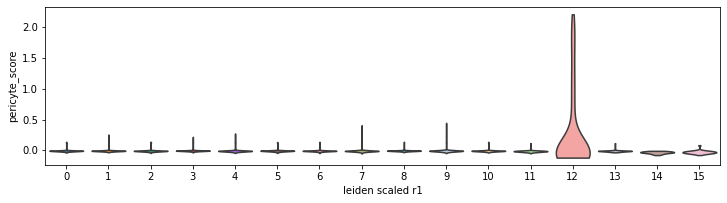

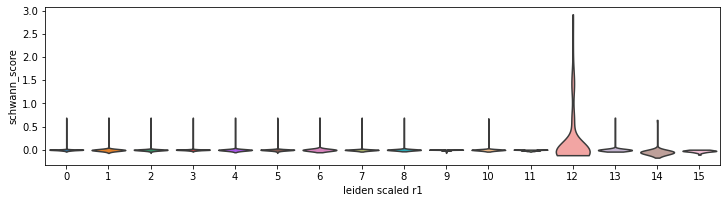

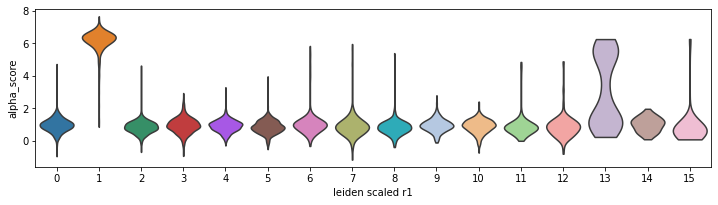

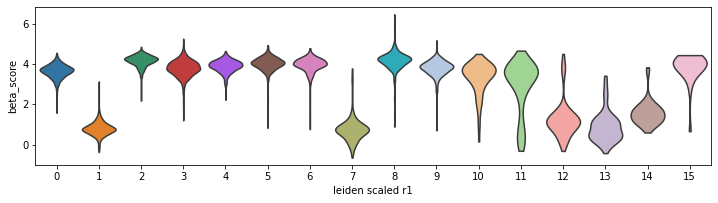

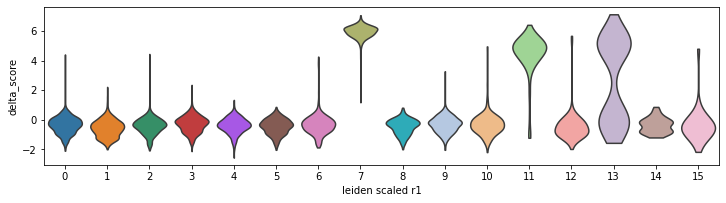

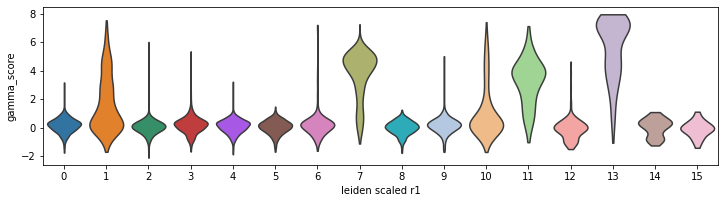

In [61]:
# Plot scores distribution across clusters
rcParams['figure.figsize']=(10,3)
for score in scores:
    sc.pl.violin(adata_rawnormalised, keys=score, groupby=clusters_col, use_raw=True, stripplot=False)

In [29]:
# Scores per cluster, scaled from 0 to 1 in each cell type
#C: Not very informative!
#scores_df=adata_rawnormalised.obs[scores+[clusters_col]]
#score_means=scores_df.groupby(clusters_col).mean()
#score_means=pd.DataFrame(pp.minmax_scale(score_means),index=score_means.index,columns=score_means.columns)
#sb.clustermap(score_means,yticklabels=1)

In [62]:
# Scores normalised to interval [0,1] for each cell type - so that they can be more easily compared
scores_df_norm=adata_rawnormalised.obs[scores]
scores_df_norm=pd.DataFrame(pp.minmax_scale(scores_df_norm),columns=scores_df_norm.columns,index=adata_rawnormalised.obs.index)

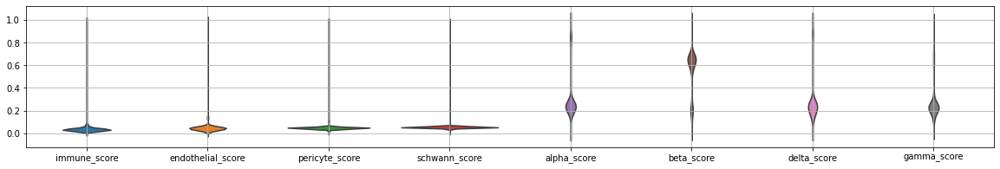

In [63]:
# Plot of normalised scores distribution in whole dataset, per cluster
rcParams['figure.figsize']=(20,3)
fig,ax=plt.subplots()
sb.violinplot(data=scores_df_norm,inner=None,ax=ax)
ax.grid()

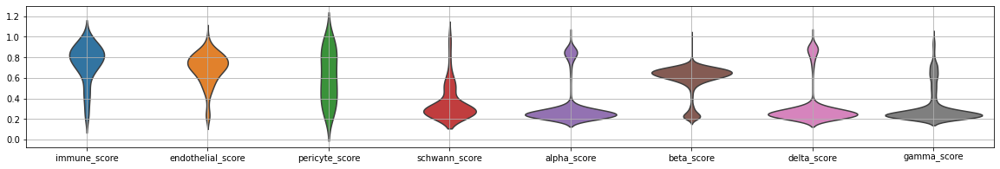

In [64]:
# Plot of normalised scores distribution, excluding low scores, per cluster
rcParams['figure.figsize']=(20,3)
fig,ax=plt.subplots()
sb.violinplot(data=scores_df_norm[scores_df_norm>0.2],inner=None,ax=ax)
ax.grid()

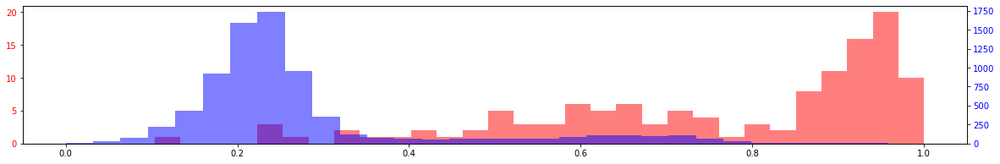

In [65]:
# Check gamma score in gamma cluster to reset the threshold
fig,ax1=plt.subplots()
a=ax1.hist(scores_df_norm.gamma_score[(adata_scl.obs[clusters_col]=='13').values],bins=30,alpha=0.5,color='r')
ax1.tick_params(axis='y', labelcolor='r')
ax2 = ax1.twinx()
a=ax2.hist(scores_df_norm.gamma_score[(adata_scl.obs[clusters_col]!='13').values],bins=30,alpha=0.5,color='b')
ax2.tick_params(axis='y', labelcolor='b')

In [100]:
# Thresholds for cell type assignemnt based on normalised scores
thresholds=[]
for col in scores_df_norm:
    threshold=0.45
    if col=='immune_score':
        threshold=0.4
    elif col=='schwann_score':
        threshold=0.2
    elif col=='pericyte_score':
        threshold=0.2
    elif col=='gamma_score':
        threshold=0.8
    elif col=='alpha_score':
        threshold=0.5
    elif col=='delta_score':
        threshold=0.55
    thresholds.append(threshold)

In [101]:
# Assign cell types based on scores to each cell
assignment_df=scores_df_norm>=thresholds
assignment_df.columns=[col.replace('_score','') for col in scores_df_norm.columns] 

In [102]:
# Count of cells per cell type
assignment_df[[col.replace('_score','') for col in scores_df_norm.columns]].sum()

immune           59
endothelial     118
pericyte         34
schwann          60
alpha           966
beta           5873
delta           754
gamma           116
dtype: int64

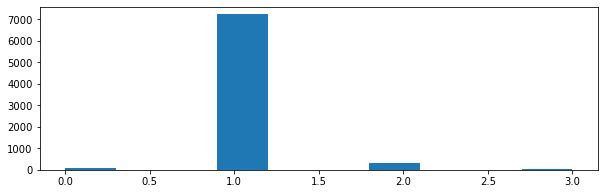

In [103]:
# How many cell types were annotated to each cell
rcParams['figure.figsize']=(10,3)
a=plt.hist(assignment_df.sum(axis=1))

In [104]:
# For each cell make a (standard) string of annotated cell types: 
# e.g. each annotated cell type in the same order, separated by '_' when multiple cell types were annotated
type_unions=[]
for idx,row in assignment_df.iterrows():
    type_union=''
    for col in row.index:
        if row[col]:
            type_union=type_union+col+'_'
    if type_union=='':
        type_union='NA'
    type_unions.append(type_union.rstrip('_'))

In [105]:
# Add cell types strings of cells to scores/assignment DF
assignment_df['type_union']=type_unions
assignment_df[clusters_col]=adata_rawnormalised.obs[clusters_col].values

### Annotate clusters

In [6]:
def add_category(df,idxs,col,category):
    """
    Add single value to multiple rows of DF column (useful when column might be categorical). 
    If column is categorical the value is beforehand added in the list of present categories 
    (required for categorical columns). 
    :param df: DF to which to add values
    :param idxs: Index names of rows where the value should be assigned to the column.
    :param col: Column to which to add the value.
    :param category: The value to add to rows,column.
    """
    # If column is already present, is categorical and value is not in categories add the value to categories first.
    if col in df.columns and df[col].dtype.name=='category' and category not in df[col].cat.categories:
        df[col] = df[col].cat.add_categories([category])
    df.loc[idxs,col]=category

In [107]:
# Make DF of marker gene expressions (normalised, log transformed), scaled for each gene to [0,1]
used_markers=list(dict.fromkeys([marker for marker_list in markers_selection.values() for marker in marker_list]))
gene_idx=adata_rawnormalised.raw.var_names.isin(used_markers)
genes=adata_rawnormalised.raw.var_names[gene_idx]
scaled_expression=pd.DataFrame(pp.minmax_scale(adata_rawnormalised.raw.X.toarray()[:, gene_idx]),
                               columns=genes,index=adata_rawnormalised.obs.index
                              )[[marker for marker in used_markers if marker in genes]]


def subcluster(adata_cluster,res,original_cluster,assignment_df_temp,clusters_name_prefix='leiden_scaled_r'):
    """
    Cluster adata and add reult into cell type assignment DF. Plot the clustering on UMAP.
    Add name of the original cluster to which the adata belongs to new cluster names.
    Cluster column name: clusters_name_prefix+str(res) 
    :param adata_cluster: Adata (with already computed neighbours and UMAP) to cluster with leiden clustering. 
    :param res: Leiden resolution
    :param original_cluster: Original cluster name, new clusters are named 'original cluster'+'_'+'new cluster'
    :param assignment_df_temp: assignment_df to which to add clusters - should have same row order as adata
    :param clusters_name_prefix: Prefix for cluster column name.
    """
    clusters_col_name=clusters_name_prefix+str(res)
    sc.tl.leiden(adata_cluster, resolution=res, key_added=clusters_col_name, directed=True, use_weights=True)
    adata_cluster.obs[clusters_col_name]=[original_cluster+'_'+subcluster 
                                                 for subcluster in adata_cluster.obs[clusters_col_name]]
    sc.pl.umap(adata_cluster,color=clusters_col_name)
    time.sleep(1.0)
    
    assignment_df_temp['leiden_scaled_r'+str(res)]=adata_cluster.obs['leiden_scaled_r'+str(res)].values
    
def recompute_pca_neighbours(adata,n_pcs=N_PCS):
    # For subclustering recomputing only neighbours makes no big difference, 
    # recomputing also PCA makes the csubclustering worse
    sc.pp.pca(adata, n_comps=n_pcs, use_highly_variable=True, svd_solver='arpack')
    sc.pp.neighbors(adata,n_pcs = N_PCS) 
    
def get_cluster_data(adata_original, cluster,cluster_col,assignment_df):
    """
    Subset adata and assignment_df to cluster.
    :param adata_original: Adata to subset.
    :param  cluster: Cluster for which to extract the data.
    :param cluster_col: Column where clusters are listed. Should be present in adata and assignment_df.
    :param assignment_df: DF with cell type assignmnets in column 'type_union' and cluster info. Should have index names
    that are present in adata.obs.index.
    :return: Subset of adata, assignment_df
    """
    adata_temp=adata_original[adata_original.obs[cluster_col]==cluster].copy()
    assignment_df_temp=pd.DataFrame(assignment_df.loc[adata_temp.obs.index,'type_union'])
    return adata_temp, assignment_df_temp

def cluster_annotate(assignment_df,cluster_col,present_threshold,nomain_threshold,
                     save,cluster_annotation,adata_main):
    """
    Loop through clusters, check present cell types and if there is no main cell type plot expression and QC metrics.
    For each cluster list proportion of present cell types.
    Expression (normalised, log transformed, [0,1] per gene scaled) is plotted for marker genes across cells (heatmap).
    QC metrics are plotted as scatterplot of N genes and N counts with cluster cells overlayed over all cels.
    :param assignment_df: DF with cell type assignment in column 'type_union' and cluster assignment.
    :param cluster_col: Cluster column name in assignment_df.
    :param present_threshold: Count among present cell types each cell type present if it represents 
    at least present_threshold proportion of cells in cluster. 
    :param nomain_threshold: If only 1 cell type was selected with present_threshold and 
    no cell type is present at proportion at least nomain_threshold add 'other' to annotated cell types list.
    :param save: Save cluster information to adata_main (column 'cluster') and cell types list to cluster_annotation.
    :param cluster_annotation: Dict where each cluster (key) has list of annotated cell types (value).
    :param adata_main: Add cluster to adata_main.obs.cluster. Use this adata for plotting of QC mettrics (for this a
    column 'temp_selected' is added.)
    """
    for group in assignment_df[['type_union',cluster_col]].groupby(cluster_col):
        types_summary=group[1].type_union.value_counts(normalize=True)
        present=list(types_summary[types_summary >= present_threshold].index)
        if len(present)==1 and types_summary.max() < nomain_threshold:
            present.append('other')
            
        if save:
            save_cluster_annotation(adata=adata_main,cluster_name=group[0],cell_types=present,cell_names=group[1].index)
        
        print('\nCluster:',group[0],'\tsize:',group[1].shape[0])    
        print('Present:',present)
        print(types_summary)
        
        #present_nonna=[cell_type for cell_type in present if cell_type !='NA']
        #if len(present_nonna)!=1:
        if len(present)!=1 or present==['NA']:
            sb.clustermap(
                pd.DataFrame(scaled_expression.loc[group[1].index,:]),
                col_cluster=False,xticklabels=1,yticklabels=False,figsize=(7,5))
            plt.title('Cluster: '+group[0]+' assigned:'+str(present))
            adata_main.obs['temp_selected']=adata_main.obs.index.isin(group[1].index)
            rcParams['figure.figsize']=(5,5)
            p1 = sc.pl.scatter(adata_main, 'n_counts', 'n_genes', color='temp_selected', size=40,color_map='viridis')
            time.sleep(1.0)

def save_cluster_annotation(adata,cluster_name,cell_types:list,cell_names):
    """
    Save cluster information for a set of cells to cluster_annotation (from outer scope) dictionary and specified adata.
    :param adata: Adata to which to save cluster name for cells. 
    Cluster information is saved to adata.obs in 'cluster' column.
    :param cluster_name: Name of the cluster.
    :param cell_types: List of cell types annotated to the cluster.
    :param cell_names: Cell names (matching adata.obs.index) to which the new cluster is asigned.
    """
    cluster_annotation[cluster_name]=cell_types
    add_category(df=adata.obs,idxs=cell_names,col='cluster',category=cluster_name)

In [108]:
#Save cell types annotated to each cluster
cluster_annotation=dict()


Cluster: 0 	size: 959
Present: ['beta']
beta            0.984359
alpha_beta      0.007299
NA              0.006257
beta_delta      0.001043
schwann_beta    0.001043
Name: type_union, dtype: float64

Cluster: 1 	size: 869
Present: ['alpha']
alpha            0.951669
alpha_gamma      0.026467
schwann_alpha    0.010357
NA               0.004603
gamma            0.004603
alpha_beta       0.002301
Name: type_union, dtype: float64

Cluster: 2 	size: 842
Present: ['beta']
beta                0.982185
beta_delta          0.005938
alpha_beta          0.004751
schwann_beta        0.003563
NA                  0.002375
alpha_beta_gamma    0.001188
Name: type_union, dtype: float64

Cluster: 3 	size: 825
Present: ['beta']
beta            0.989091
NA              0.009697
schwann_beta    0.001212
Name: type_union, dtype: float64

Cluster: 4 	size: 694
Present: ['beta']
beta            0.991354
schwann_beta    0.005764
alpha_beta      0.001441
NA              0.001441
Name: type_union, dtype: float64

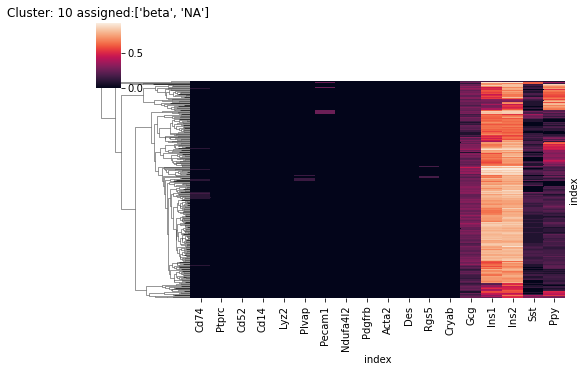

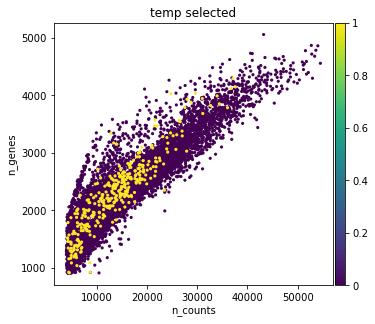


Cluster: 11 	size: 168
Present: ['beta_delta', 'delta']
beta_delta          0.720238
delta               0.148810
NA                  0.065476
alpha_beta_delta    0.023810
delta_gamma         0.023810
beta_delta_gamma    0.005952
alpha_delta         0.005952
beta                0.005952
Name: type_union, dtype: float64


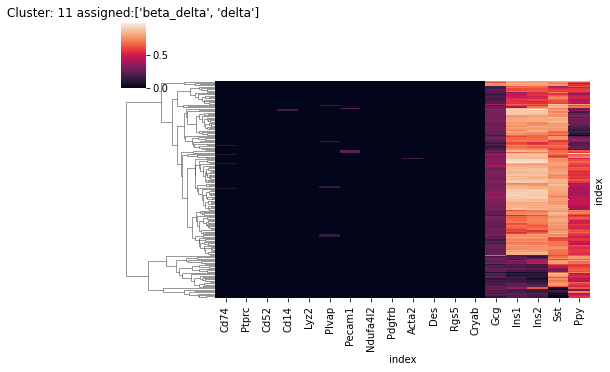

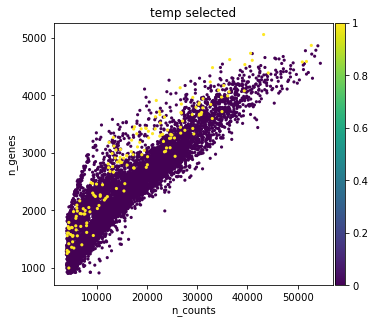


Cluster: 12 	size: 146
Present: ['endothelial', 'other']
endothelial                     0.643836
endothelial_pericyte            0.068493
endothelial_pericyte_schwann    0.061644
schwann                         0.047945
pericyte_beta                   0.034247
beta                            0.034247
pericyte_schwann                0.027397
pericyte                        0.013699
schwann_delta                   0.013699
endothelial_alpha               0.013699
endothelial_pericyte_beta       0.006849
pericyte_schwann_beta           0.006849
NA                              0.006849
endothelial_schwann             0.006849
schwann_beta                    0.006849
endothelial_delta               0.006849
Name: type_union, dtype: float64


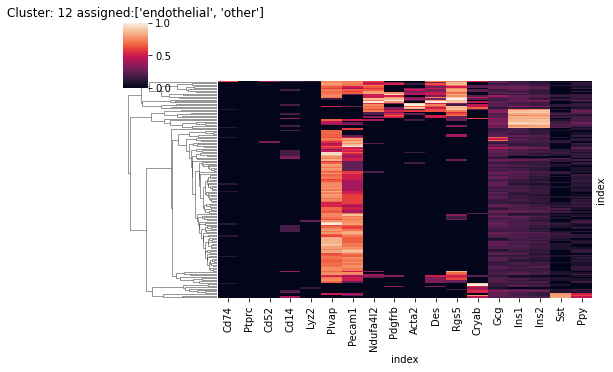

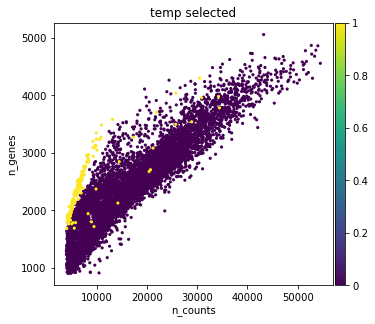


Cluster: 13 	size: 125
Present: ['gamma', 'alpha_delta']
gamma                0.376
alpha_delta          0.304
delta_gamma          0.096
alpha_delta_gamma    0.040
NA                   0.040
alpha_beta_delta     0.040
delta                0.032
alpha_gamma          0.024
alpha                0.016
beta_gamma           0.008
beta_delta_gamma     0.008
schwann_alpha        0.008
beta                 0.008
Name: type_union, dtype: float64


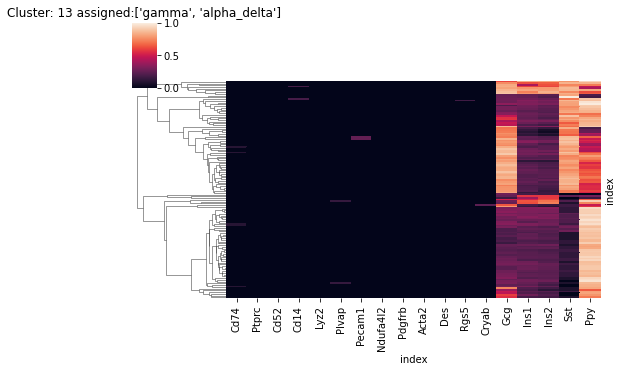

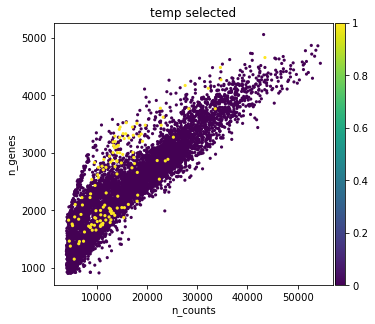


Cluster: 14 	size: 60
Present: ['immune']
immune            0.933333
immune_beta       0.033333
immune_schwann    0.016667
beta              0.016667
Name: type_union, dtype: float64

Cluster: 15 	size: 27
Present: ['beta']
beta          0.925926
beta_delta    0.037037
alpha         0.037037
Name: type_union, dtype: float64


In [109]:
# Display cell type annotation distribution of each cluster.
cluster_annotate(assignment_df=assignment_df,
                 cluster_col=clusters_col,present_threshold=0.1,nomain_threshold=0.9,
                     save=True,cluster_annotation=cluster_annotation,adata_main=adata_rawnormalised)

#C: Cluster 15 (beta cells) is quite isolated from other beta clusters. QC metrics (above) do not indicate low quality cells. Thus it is annotated as 'beta_subpopulation'.

In [110]:
# Rename beta subpopulation
cluster_annotation['15']=['beta_subpopulation_STZref']

... storing 'leiden_scaled_r0.2' as categorical


**** Original cluster 10


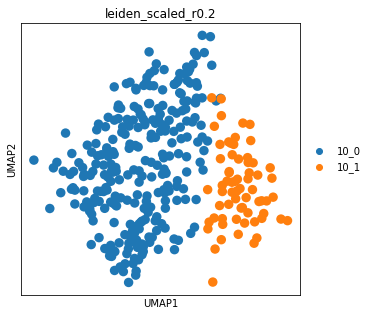


Cluster: 10_0 	size: 271
Present: ['beta', 'NA']
beta          0.789668
NA            0.166052
gamma         0.022140
beta_delta    0.011070
beta_gamma    0.007380
delta         0.003690
Name: type_union, dtype: float64


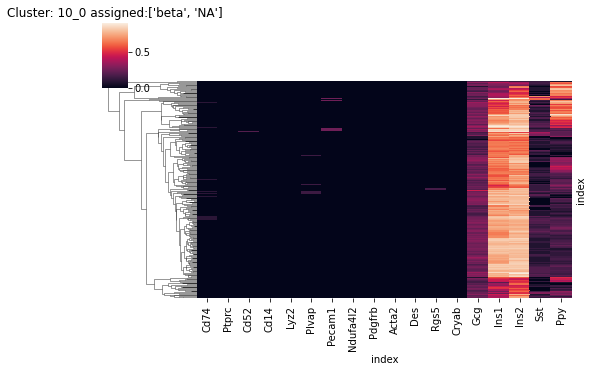

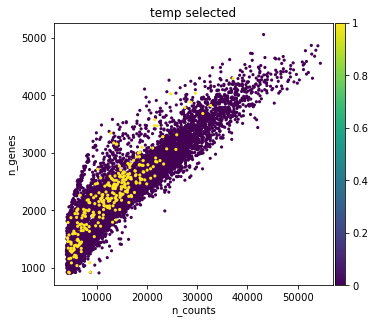

... storing 'leiden_scaled_r0.2' as categorical



Cluster: 10_1 	size: 65
Present: ['beta']
beta            0.984615
schwann_beta    0.015385
Name: type_union, dtype: float64
**** Original cluster 11


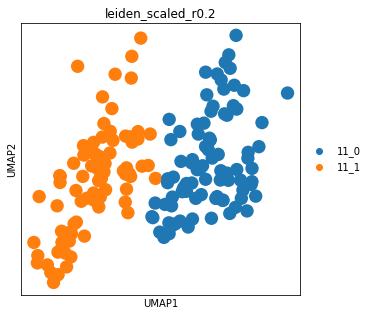


Cluster: 11_0 	size: 89
Present: ['beta_delta']
beta_delta          0.955056
alpha_beta_delta    0.033708
beta                0.011236
Name: type_union, dtype: float64

Cluster: 11_1 	size: 79
Present: ['beta_delta', 'delta', 'NA']
beta_delta          0.455696
delta               0.316456
NA                  0.139241
delta_gamma         0.050633
alpha_beta_delta    0.012658
beta_delta_gamma    0.012658
alpha_delta         0.012658
Name: type_union, dtype: float64


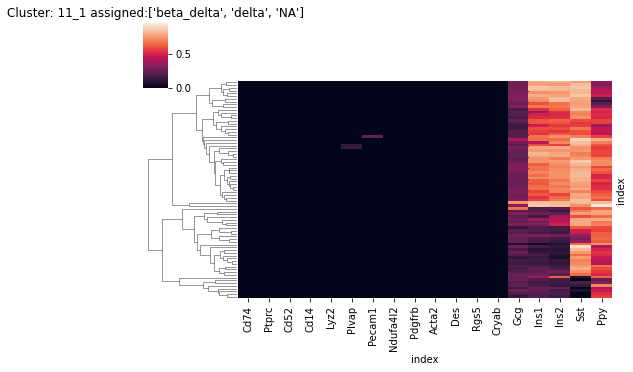

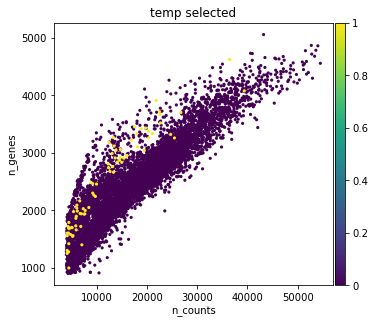

... storing 'leiden_scaled_r0.2' as categorical


**** Original cluster 12


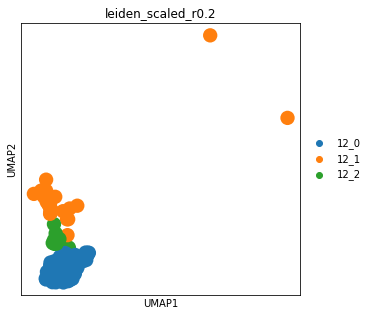


Cluster: 12_0 	size: 101
Present: ['endothelial']
endothelial             0.910891
endothelial_pericyte    0.049505
endothelial_alpha       0.019802
NA                      0.009901
endothelial_schwann     0.009901
Name: type_union, dtype: float64

Cluster: 12_1 	size: 31
Present: ['schwann', 'pericyte_beta', 'beta', 'pericyte_schwann']
schwann                      0.225806
pericyte_beta                0.161290
beta                         0.161290
pericyte_schwann             0.129032
pericyte                     0.064516
endothelial                  0.064516
schwann_delta                0.064516
schwann_beta                 0.032258
pericyte_schwann_beta        0.032258
endothelial_pericyte_beta    0.032258
endothelial_delta            0.032258
Name: type_union, dtype: float64


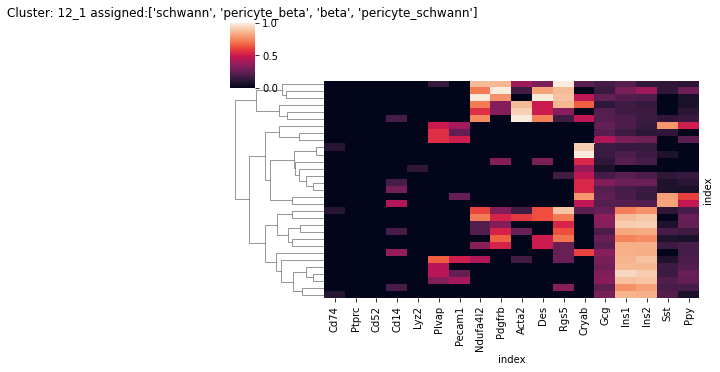

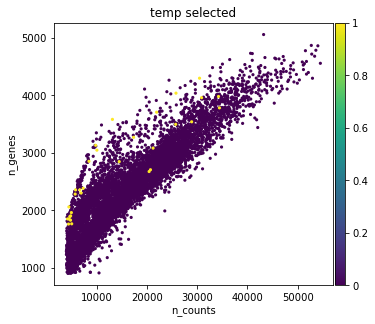


Cluster: 12_2 	size: 14
Present: ['endothelial_pericyte_schwann', 'endothelial_pericyte']
endothelial_pericyte_schwann    0.642857
endothelial_pericyte            0.357143
Name: type_union, dtype: float64


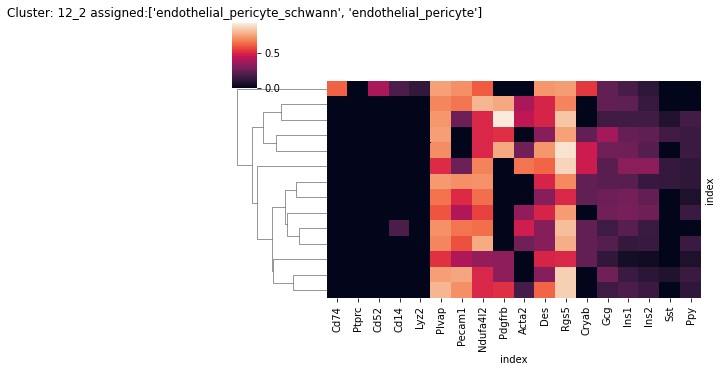

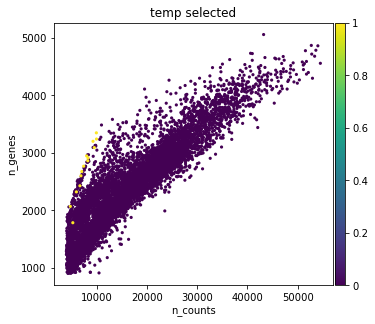

... storing 'leiden_scaled_r0.2' as categorical


**** Original cluster 13


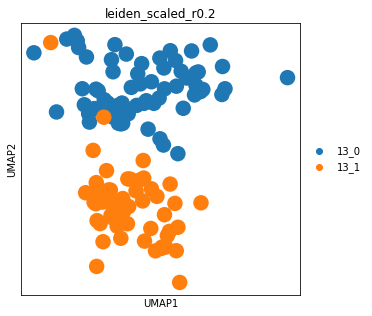


Cluster: 13_0 	size: 68
Present: ['gamma', 'other']
gamma                0.691176
NA                   0.073529
alpha_beta_delta     0.044118
alpha_gamma          0.044118
alpha_delta          0.029412
alpha                0.029412
delta_gamma          0.014706
alpha_delta_gamma    0.014706
beta_gamma           0.014706
beta_delta_gamma     0.014706
beta                 0.014706
schwann_alpha        0.014706
Name: type_union, dtype: float64


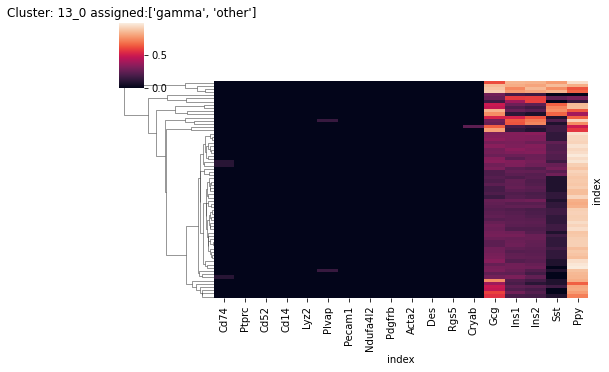

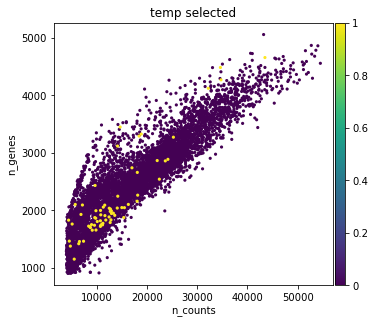


Cluster: 13_1 	size: 57
Present: ['alpha_delta', 'delta_gamma']
alpha_delta          0.631579
delta_gamma          0.192982
alpha_delta_gamma    0.070175
delta                0.070175
alpha_beta_delta     0.035088
Name: type_union, dtype: float64


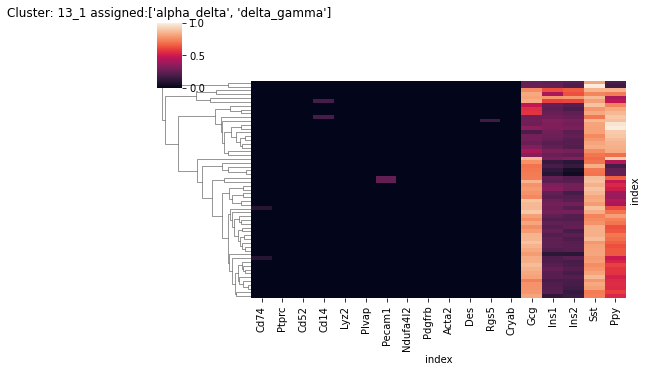

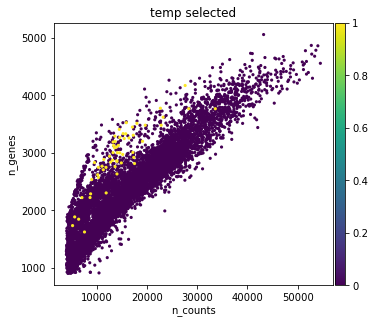

In [111]:
# Recluster clusters that previously had less or more than 1 annotted cell type (exclusing 'NA' and 'other').
for cluster in sorted(list(adata_rawnormalised.obs['cluster'].unique()),key=int):
    if len(cluster_annotation[cluster]) != 1 or len(
        [cell_type for cell_type in cluster_annotation[cluster] if cell_type !='NA' and cell_type !='other']) == 0:
        print('**** Original cluster',cluster)
        res=0.2
        adata_temp,assignment_df_temp=get_cluster_data(adata_original=adata_rawnormalised, cluster=cluster,
                                                       cluster_col='cluster',assignment_df=assignment_df)
        subcluster(adata_cluster=adata_temp,res=res,original_cluster=cluster,assignment_df_temp=assignment_df_temp)
        cluster_annotate(assignment_df=assignment_df_temp,
                         cluster_col='leiden_scaled_r'+str(res),
                         # Use more leanient condition as this is already subclustered - 
                        # otherwise data could be in some cases subclustered almost idefinitely
                         present_threshold=0.1,nomain_threshold=0.8,
                     save=True,cluster_annotation=cluster_annotation,adata_main= adata_rawnormalised)

In [112]:
# Correct entries in cluster_annotation dict - all clusters that do not have exactly one entry will be assigned 'NA'
# If cluster is to be removed add 'remove'
cluster_annotation['12_2']=['endothelial_pericyte']

... storing 'leiden_scaled_r0.5' as categorical


**** Original cluster 10_0


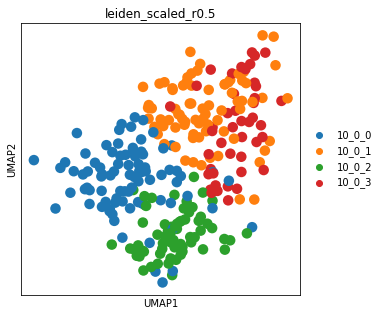


Cluster: 10_0_0 	size: 85
Present: ['beta', 'NA']
beta          0.564706
NA            0.317647
gamma         0.070588
beta_delta    0.023529
beta_gamma    0.011765
delta         0.011765
Name: type_union, dtype: float64


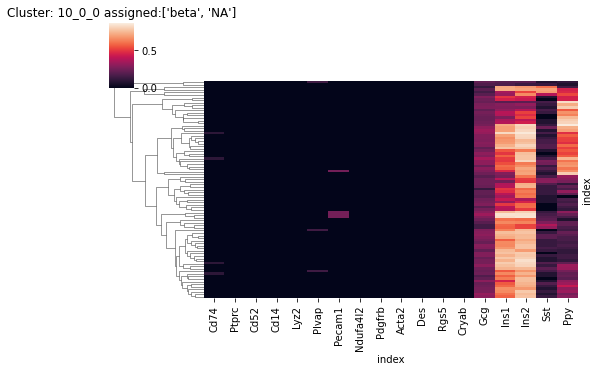

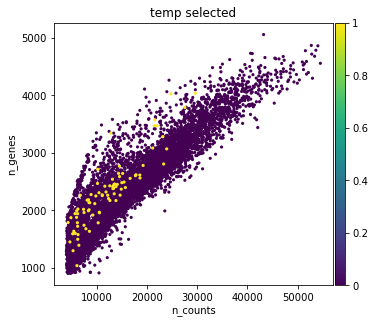

... storing 'leiden_scaled_r0.5' as categorical



Cluster: 10_0_1 	size: 77
Present: ['beta']
beta    0.883117
NA      0.116883
Name: type_union, dtype: float64

Cluster: 10_0_2 	size: 65
Present: ['beta']
beta          0.876923
NA            0.107692
beta_delta    0.015385
Name: type_union, dtype: float64

Cluster: 10_0_3 	size: 44
Present: ['beta']
beta          0.931818
NA            0.045455
beta_gamma    0.022727
Name: type_union, dtype: float64
**** Original cluster 11_1


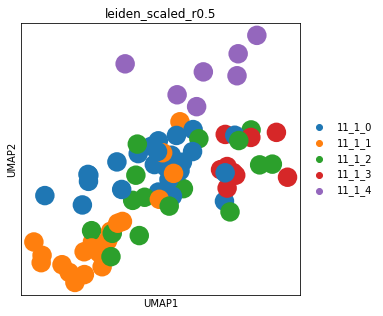


Cluster: 11_1_0 	size: 26
Present: ['beta_delta', 'delta', 'NA']
beta_delta    0.384615
delta         0.346154
NA            0.269231
Name: type_union, dtype: float64


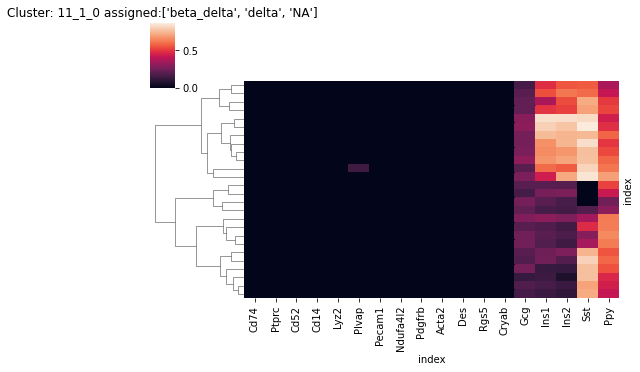

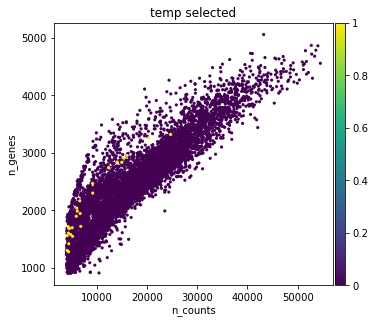


Cluster: 11_1_1 	size: 21
Present: ['beta_delta', 'delta']
beta_delta    0.619048
delta         0.380952
Name: type_union, dtype: float64


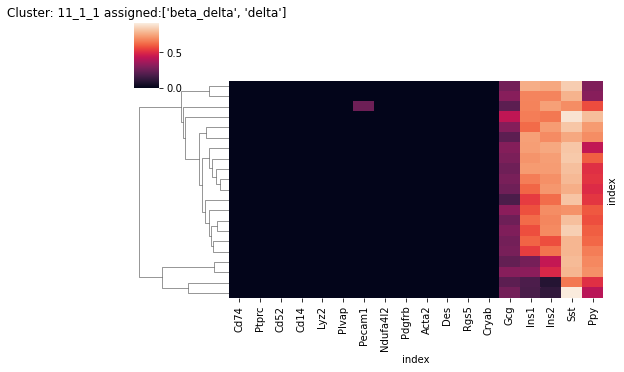

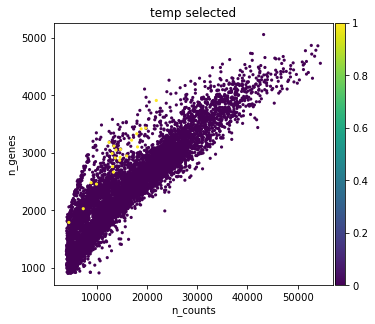


Cluster: 11_1_2 	size: 16
Present: ['delta', 'beta_delta']
delta               0.2500
beta_delta          0.2500
NA                  0.1875
delta_gamma         0.1250
alpha_beta_delta    0.0625
beta_delta_gamma    0.0625
alpha_delta         0.0625
Name: type_union, dtype: float64


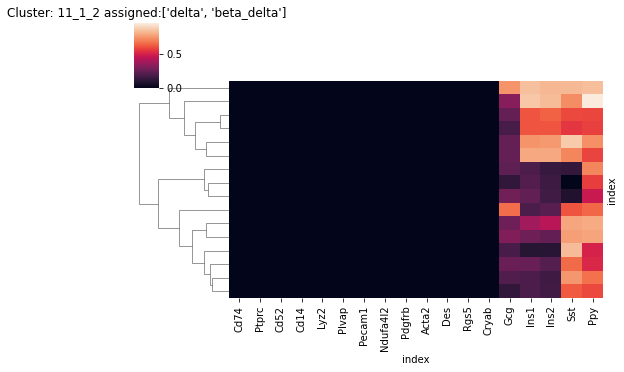

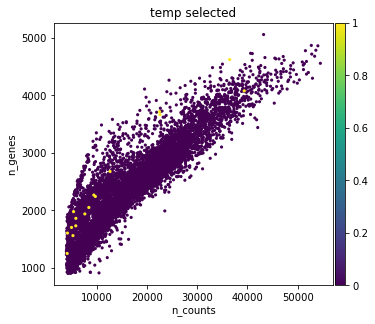


Cluster: 11_1_3 	size: 9
Present: ['beta_delta', 'delta']
beta_delta    0.666667
delta         0.222222
NA            0.111111
Name: type_union, dtype: float64


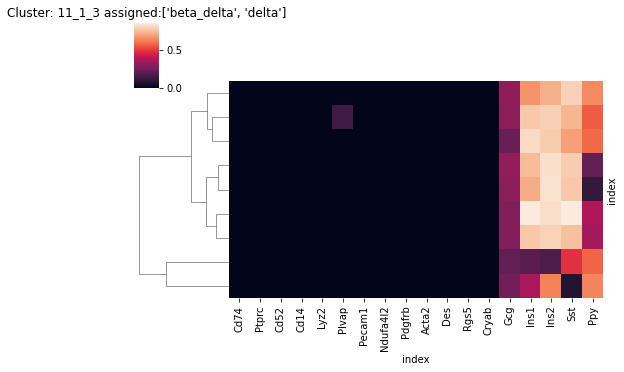

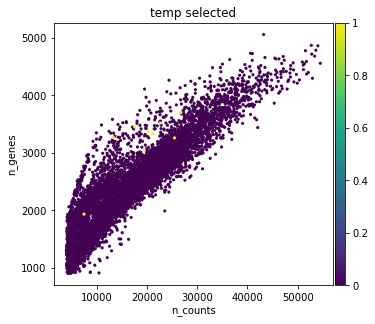


Cluster: 11_1_4 	size: 7
Present: ['beta_delta', 'delta_gamma', 'delta']
beta_delta     0.428571
delta_gamma    0.285714
delta          0.285714
Name: type_union, dtype: float64


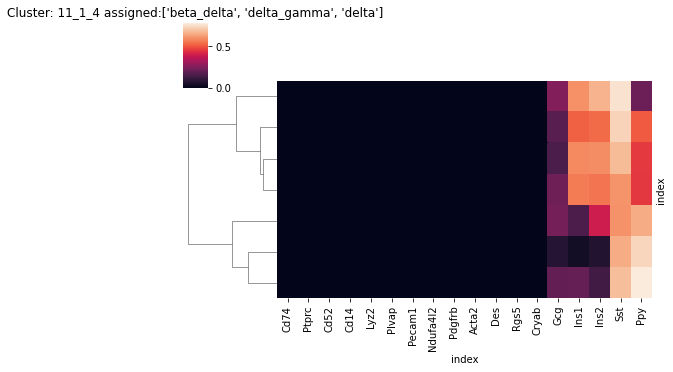

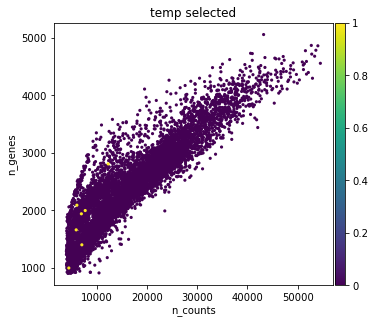

... storing 'leiden_scaled_r0.5' as categorical


**** Original cluster 12_1


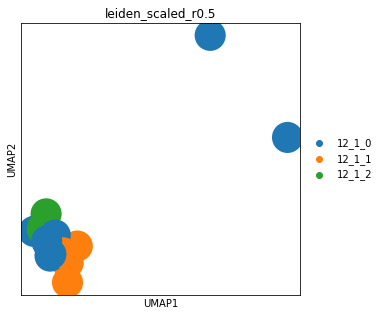


Cluster: 12_1_0 	size: 18
Present: ['pericyte_beta', 'schwann', 'pericyte_schwann']
pericyte_beta            0.277778
schwann                  0.222222
pericyte_schwann         0.222222
pericyte                 0.111111
pericyte_schwann_beta    0.055556
schwann_delta            0.055556
beta                     0.055556
Name: type_union, dtype: float64


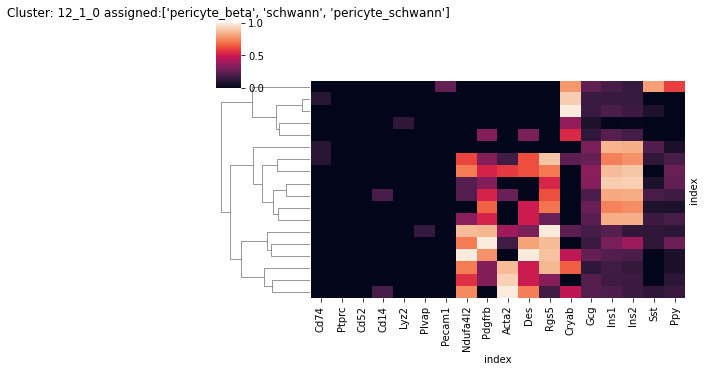

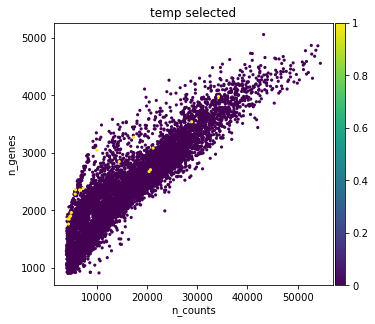


Cluster: 12_1_1 	size: 7
Present: ['beta', 'endothelial']
beta                         0.428571
endothelial                  0.285714
endothelial_pericyte_beta    0.142857
endothelial_delta            0.142857
Name: type_union, dtype: float64


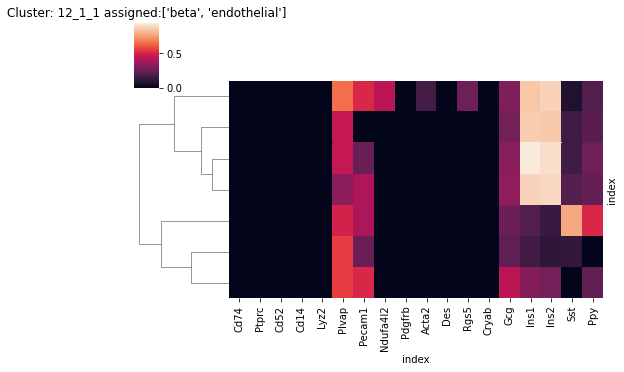

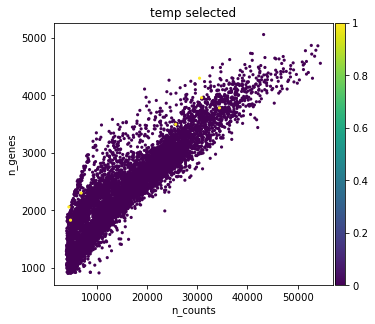


Cluster: 12_1_2 	size: 6
Present: ['schwann', 'other']
schwann          0.500000
schwann_beta     0.166667
schwann_delta    0.166667
beta             0.166667
Name: type_union, dtype: float64


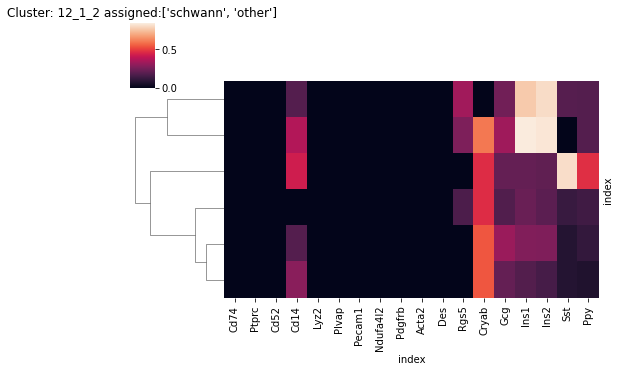

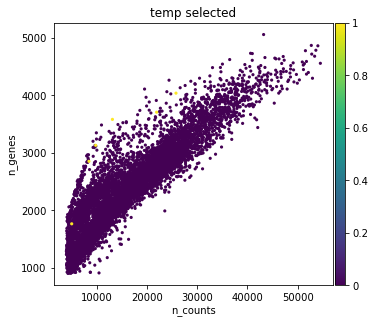

... storing 'leiden_scaled_r0.5' as categorical


**** Original cluster 13_0


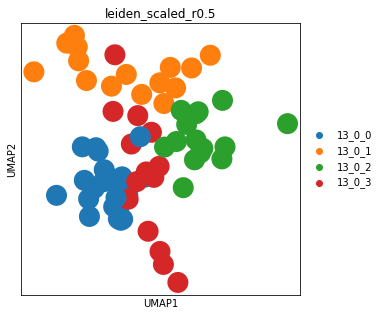


Cluster: 13_0_0 	size: 24
Present: ['gamma']
gamma    0.916667
alpha    0.041667
NA       0.041667
Name: type_union, dtype: float64

Cluster: 13_0_1 	size: 15
Present: ['gamma', 'alpha_gamma']
gamma            0.600000
alpha_gamma      0.200000
alpha            0.066667
NA               0.066667
schwann_alpha    0.066667
Name: type_union, dtype: float64


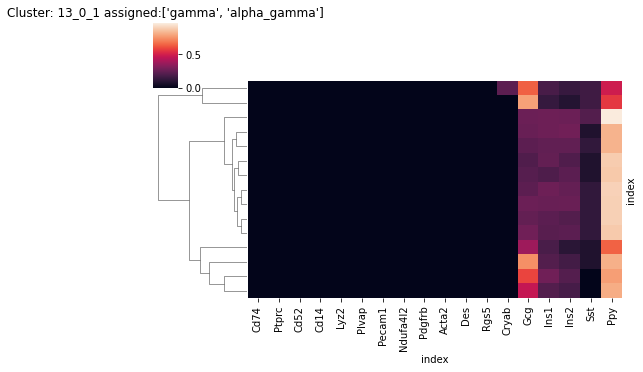

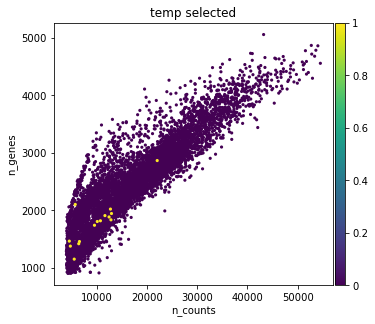


Cluster: 13_0_2 	size: 15
Present: ['gamma', 'NA']
gamma         0.666667
NA            0.200000
beta_gamma    0.066667
beta          0.066667
Name: type_union, dtype: float64


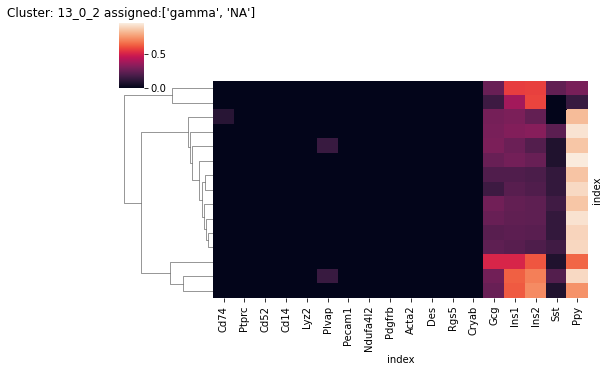

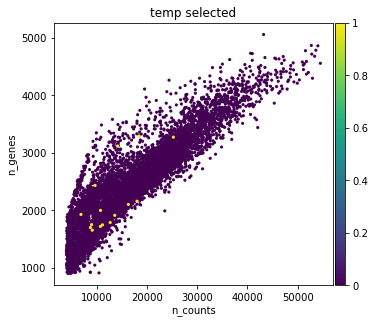


Cluster: 13_0_3 	size: 14
Present: ['gamma', 'alpha_beta_delta']
gamma                0.428571
alpha_beta_delta     0.214286
alpha_delta          0.142857
delta_gamma          0.071429
alpha_delta_gamma    0.071429
beta_delta_gamma     0.071429
Name: type_union, dtype: float64


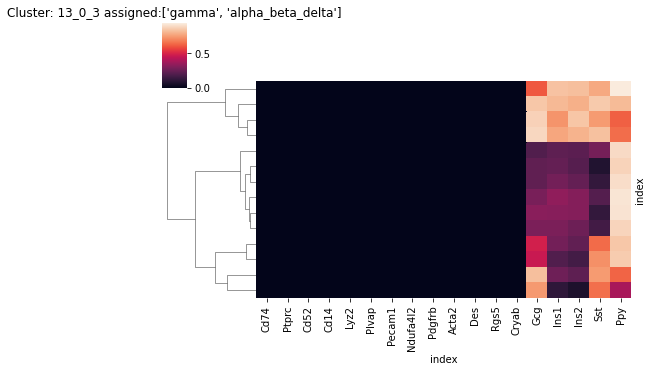

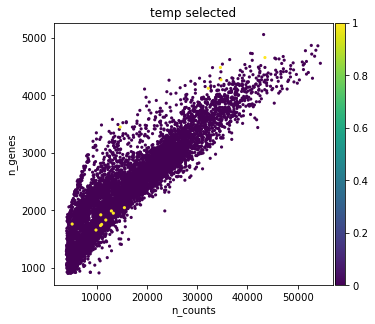

... storing 'leiden_scaled_r0.5' as categorical


**** Original cluster 13_1


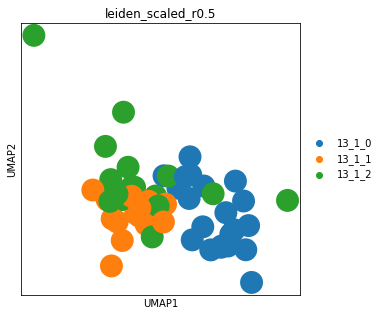


Cluster: 13_1_0 	size: 21
Present: ['delta_gamma', 'other']
delta_gamma          0.476190
alpha_delta          0.190476
alpha_delta_gamma    0.142857
delta                0.142857
alpha_beta_delta     0.047619
Name: type_union, dtype: float64


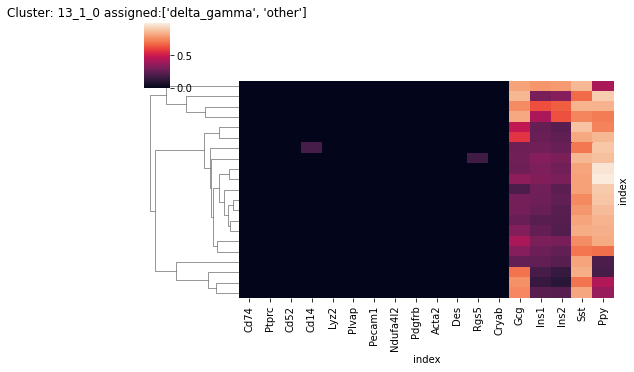

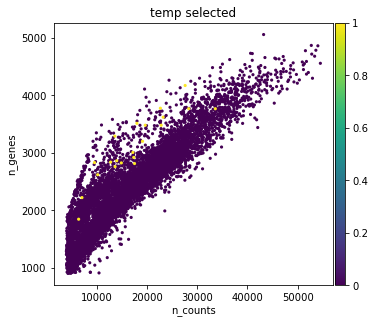


Cluster: 13_1_1 	size: 19
Present: ['alpha_delta']
alpha_delta          0.894737
delta_gamma          0.052632
alpha_delta_gamma    0.052632
Name: type_union, dtype: float64

Cluster: 13_1_2 	size: 17
Present: ['alpha_delta']
alpha_delta         0.882353
alpha_beta_delta    0.058824
delta               0.058824
Name: type_union, dtype: float64


In [113]:
# recluster clusters that previously had less or more than 1 annotted cell type (exclusing NA and other).
for cluster in sorted(list(adata_rawnormalised.obs['cluster'].unique()),key=int):
    if len(cluster_annotation[cluster]) != 1 or len(
        [cell_type for cell_type in cluster_annotation[cluster] if cell_type !='NA' and cell_type !='other']) == 0:
        print('**** Original cluster',cluster)
        res=0.5
        
        adata_temp,assignment_df_temp=get_cluster_data(adata_original=adata_rawnormalised, cluster=cluster,
                                                       cluster_col='cluster',assignment_df=assignment_df)
        # Recomputing PCA and neighbours makes situation worse
        #recompute_pca_neighbours(adata_temp)
        subcluster(adata_cluster=adata_temp,res=res,original_cluster=cluster,assignment_df_temp=assignment_df_temp)
        cluster_annotate(assignment_df=assignment_df_temp,
                         cluster_col='leiden_scaled_r'+str(res),
                         # Use more leanient condition as this is already subclustered - 
                        # otherwise data could be in some cases subclustered almost idefinitely
                         present_threshold=0.2,nomain_threshold=0.7,
                     save=False,cluster_annotation=cluster_annotation,adata_main= adata_rawnormalised)

#C: For must clusters the additional subclustering does not resolve the situation (will be resolved based on thresholds for individual cells). Exception is cluster 12_1 which can be subclustered (will be subclustered).

Subcluster cluster 12_1:

... storing 'leiden_scaled_r1.2' as categorical


**** Original cluster 12_1


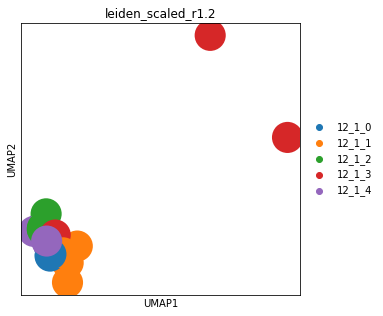


Cluster: 12_1_0 	size: 8
Present: ['pericyte_schwann', 'pericyte']
pericyte_schwann         0.500
pericyte                 0.250
pericyte_schwann_beta    0.125
pericyte_beta            0.125
Name: type_union, dtype: float64


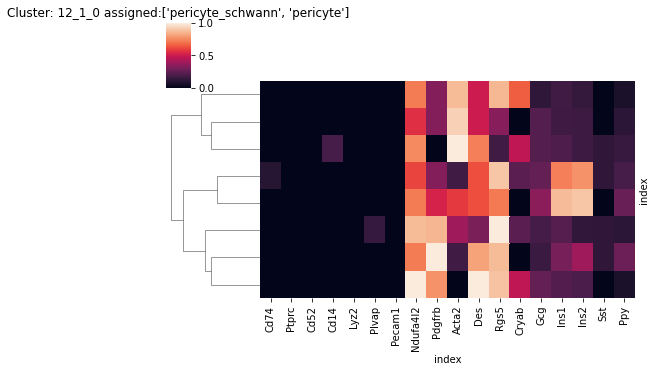

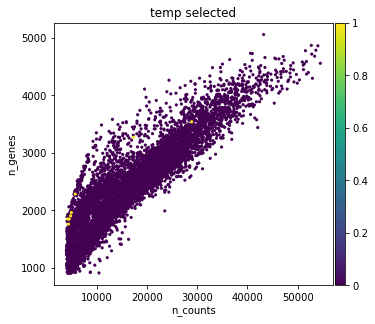


Cluster: 12_1_1 	size: 7
Present: ['beta', 'endothelial']
beta                         0.428571
endothelial                  0.285714
endothelial_pericyte_beta    0.142857
endothelial_delta            0.142857
Name: type_union, dtype: float64


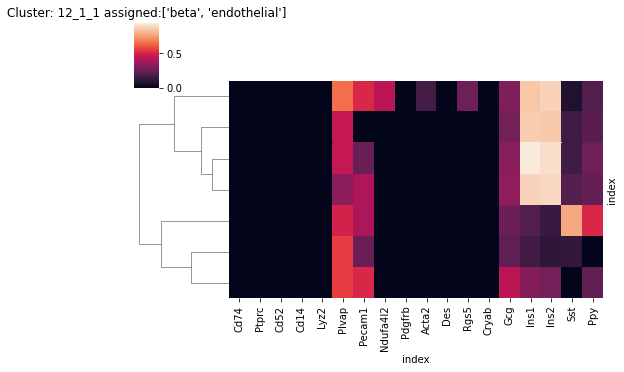

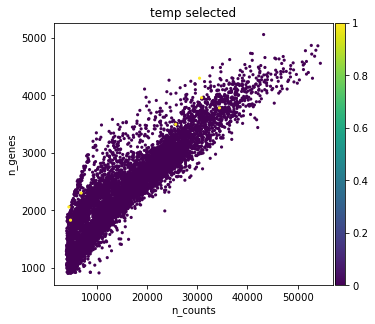


Cluster: 12_1_2 	size: 6
Present: ['schwann', 'other']
schwann          0.500000
schwann_beta     0.166667
schwann_delta    0.166667
beta             0.166667
Name: type_union, dtype: float64


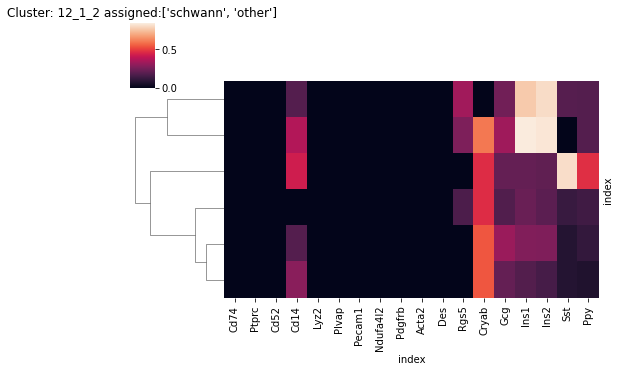

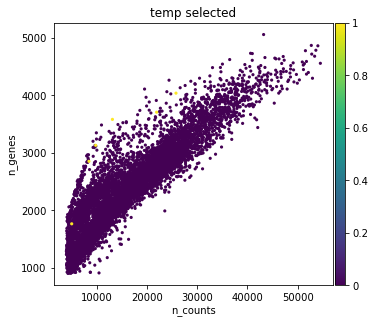


Cluster: 12_1_3 	size: 5
Present: ['pericyte_beta', 'beta']
pericyte_beta    0.8
beta             0.2
Name: type_union, dtype: float64


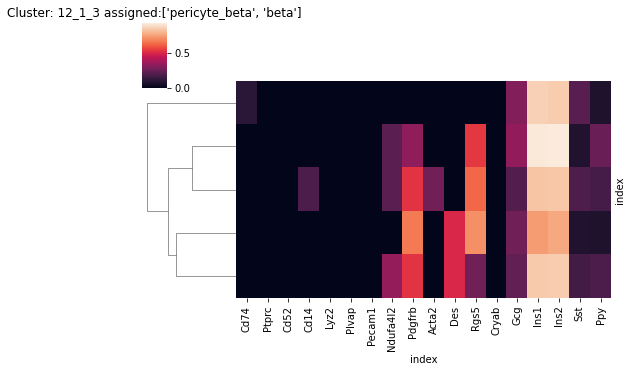

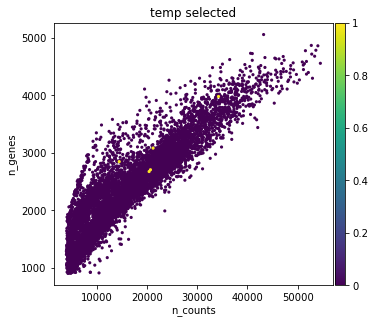


Cluster: 12_1_4 	size: 5
Present: ['schwann', 'schwann_delta']
schwann          0.8
schwann_delta    0.2
Name: type_union, dtype: float64


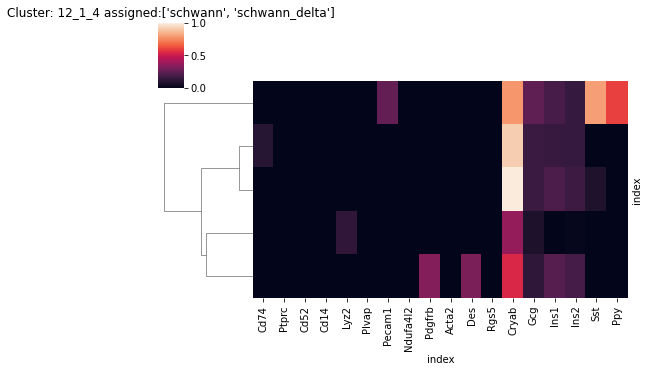

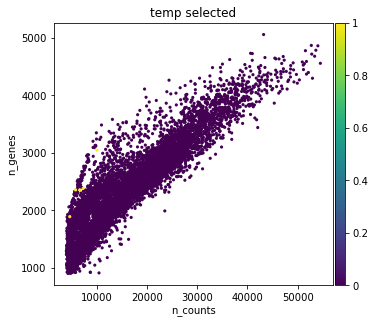

In [114]:
cluster='12_1'
print('**** Original cluster',cluster)
res=1.2

adata_temp,assignment_df_temp=get_cluster_data(adata_original=adata_rawnormalised, cluster=cluster,
                                               cluster_col='cluster',assignment_df=assignment_df)
# Recomputing PCA and neighbours makes situation worse
#recompute_pca_neighbours(adata_temp)
subcluster(adata_cluster=adata_temp,res=res,original_cluster=cluster,assignment_df_temp=assignment_df_temp)
cluster_annotate(assignment_df=assignment_df_temp,
                 cluster_col='leiden_scaled_r'+str(res),
                 # Use more leanient condition as this is already subclustered - 
                # otherwise data could be in some cases subclustered almost idefinitely
                 present_threshold=0.2,nomain_threshold=0.7,
             save=True,cluster_annotation=cluster_annotation,adata_main= adata_rawnormalised)

In [115]:
# Correct entries in cluster_annotation dict
cluster_annotation['12_1_0']=['pericyte']
#C: Set other two 14_1 subclusters to NA so that celly type list lenght filtering can be performed for other clusters
cluster_annotation['12_1_1']=['endothelial']
cluster_annotation['12_1_2']=['NA']
cluster_annotation['12_1_3']=['pericyte']
cluster_annotation['12_1_4']=['schwann']

#### Annotate cells from unsolvable clusters based on cell type score threshold
All those clusters are endocrine so strip any non-endocrine annotations from cell names.

In [116]:
# Get clusters that still do not have single cell type annotation
unsolvable=[]
for cluster in sorted(list(adata_rawnormalised.obs['cluster'].unique()),key=int):
    if len(cluster_annotation[cluster]) != 1:
        unsolvable.append(cluster)
print('Unsolvable clusters:',unsolvable)        

Unsolvable clusters: ['10_0', '11_1', '13_0', '13_1']


In [117]:
# Get all cells from the clusters 
idx_unsolvable=adata_unsolvable=adata_rawnormalised.obs.query('cluster in @unsolvable').index

In [118]:
# Make new assignments with only endocrine cell types
type_unions=[]
for idx in idx_unsolvable:
    row=assignment_df.loc[idx,:]
    type_union=''
    # Use list comprehension instead of just the endocrine list so that names of cell types stay in the same order as above
    for col in [col for col in row.index if col in ['alpha','beta','delta','gamma','epsilon']]:
        if row[col]:
            type_union=type_union+col+'_'
    if type_union=='':
        type_union='NA'
    type_unions.append(type_union.rstrip('_'))

#Reasign cell types in assignment_df
assignment_df.loc[idx_unsolvable,'type_union']=type_unions

beta_delta N: 39


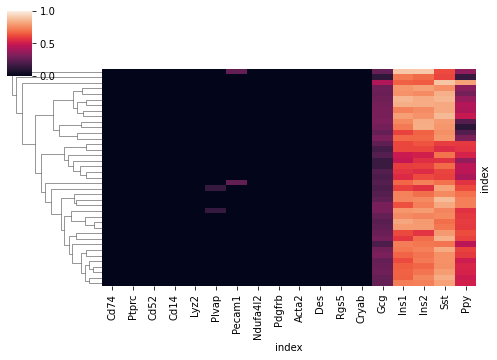

NA N: 61


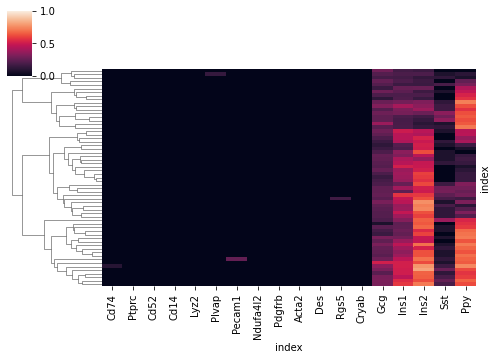

delta_gamma N: 16


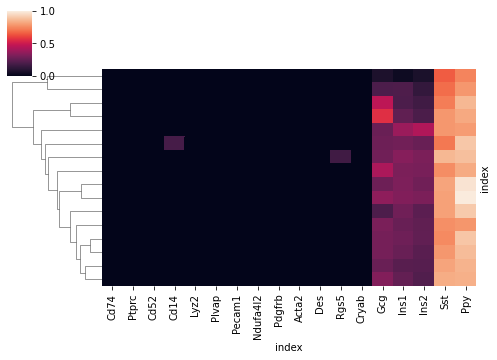

alpha_delta N: 39


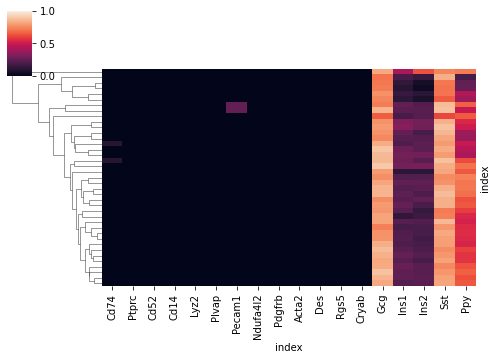

gamma N: 53


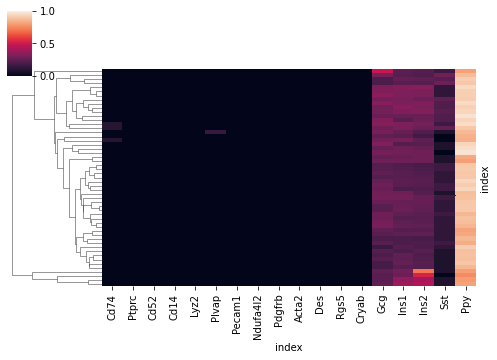

beta N: 215


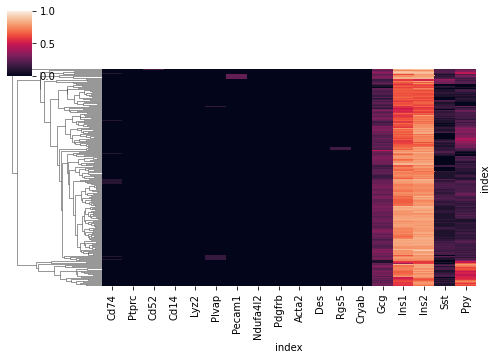

alpha_delta_gamma N: 5


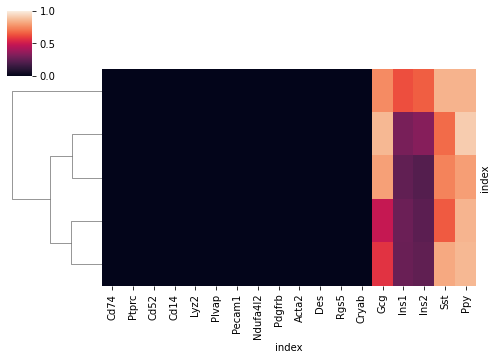

delta N: 30


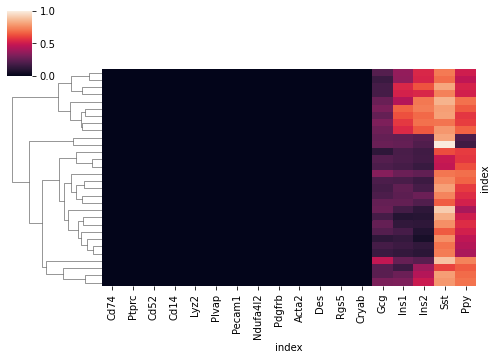

beta_gamma N: 3


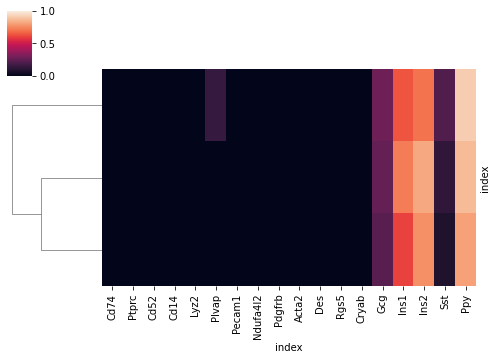

alpha N: 3


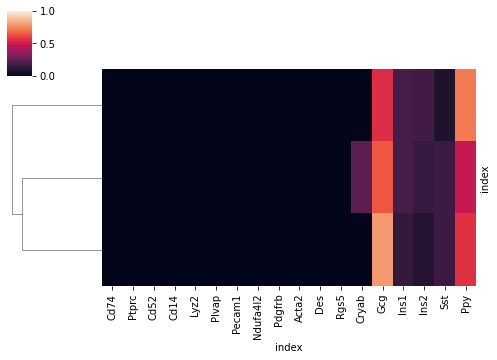

alpha_beta_delta N: 6


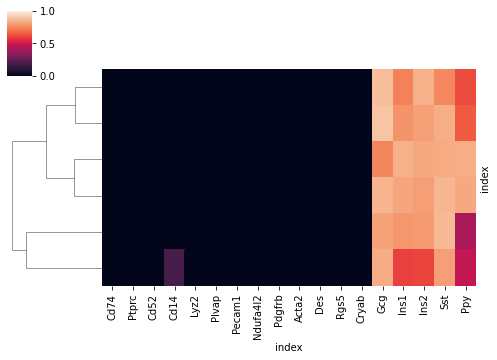

alpha_gamma N: 3


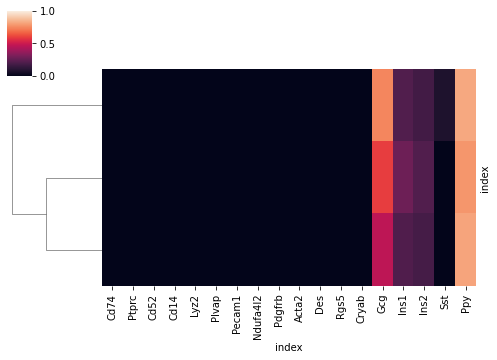

beta_delta_gamma N: 2


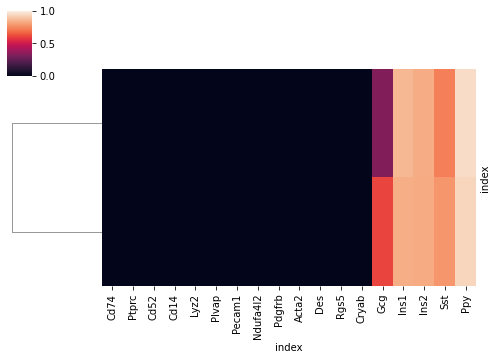

In [119]:
# Group unsolvable cells by cell type and plot expression to check if assignment was ok
for cell_type in assignment_df.loc[idx_unsolvable,'type_union'].unique():
    type_idx=assignment_df.loc[idx_unsolvable,:].query('type_union == "'+cell_type+'"').index
    print(cell_type,'N:',len(type_idx))
    row_cluster=True
    if len(type_idx)<2:
        row_cluster=False
    sb.clustermap(pd.DataFrame(scaled_expression.loc[type_idx,:]), 
                  row_cluster=row_cluster, col_cluster=False,xticklabels=1,yticklabels=False,figsize=(7,5),vmin=0,vmax=1)
    plt.show()
    time.sleep(1.0)

In [120]:
# Replace cluster names in adata and cluster_annotation with threshold based annotation
for cell_type in assignment_df.loc[idx_unsolvable,'type_union'].unique():
    # Subset assignment_df to idx_unsolvable before extracting idices of each cell type so that 
    # Cells from other clusters to not get assigned new clusters because they share phenotype
    type_idx=assignment_df.loc[idx_unsolvable,:].query('type_union == "'+cell_type+'"').index
    save_cluster_annotation(adata=adata_rawnormalised,cluster_name=cell_type,cell_types=[cell_type],cell_names=type_idx)

Show NA endocrine neighbouring cluster on UMAP (NA is given value 1)

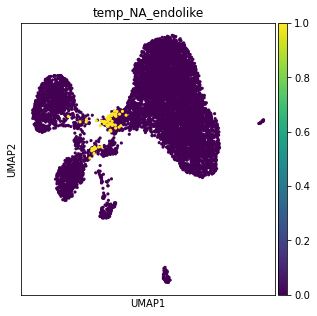

In [121]:
# Plot cluster 'NA' on UMAP
# Do not convert T/F to string so that it is sorted when plotted
adata_rawnormalised.obs['temp_NA_endolike']=adata_rawnormalised.obs.cluster=='NA' 
sc.pl.umap(adata_rawnormalised,color='temp_NA_endolike',size=40)

#C: There seems to be a low Ins beta subpopulation among endocrine-neighbouring (UMAP) NA cells. - Resolve it based on initial clusters (e.g. NA cells from cluster 10 are assigned cell type 'beta_ins_low').

In [124]:
# Find NA cells that densely overlap one of the beta clusters and reasign their cell type
idx_ins_low=adata_rawnormalised.obs.query('cluster == "NA" & '+clusters_col+' == "10"').index
save_cluster_annotation(adata=adata_rawnormalised,cluster_name='beta_ins_low',
                        cell_types=['beta_ins_low'],cell_names=idx_ins_low)

#### Add cluster based annotation to adata

In [125]:
# Display cluster annotation of clusters that will be used
clusters=list(adata_rawnormalised.obs['cluster'].unique())
clusters.sort()
for cluster in clusters:
    print(cluster ,cluster_annotation[cluster ])

0 ['beta']
1 ['alpha']
10_1 ['beta']
11_0 ['beta_delta']
12_0 ['endothelial']
12_1_0 ['pericyte']
12_1_1 ['endothelial']
12_1_2 ['NA']
12_1_3 ['pericyte']
12_1_4 ['schwann']
12_2 ['endothelial_pericyte']
14 ['immune']
15 ['beta_subpopulation']
2 ['beta']
3 ['beta']
4 ['beta']
5 ['beta']
6 ['beta']
7 ['delta']
8 ['beta']
9 ['beta']
NA ['NA']
alpha ['alpha']
alpha_beta_delta ['alpha_beta_delta']
alpha_delta ['alpha_delta']
alpha_delta_gamma ['alpha_delta_gamma']
alpha_gamma ['alpha_gamma']
beta ['beta']
beta_delta ['beta_delta']
beta_delta_gamma ['beta_delta_gamma']
beta_gamma ['beta_gamma']
beta_ins_low ['beta_ins_low']
delta ['delta']
delta_gamma ['delta_gamma']
gamma ['gamma']


In [126]:
# Add cell type annotation to clusters. 
# If clusters was annotated with more than one cell type (inbcluding NA or other) set it to 'NA'.
if 'cell_type' in adata_rawnormalised.obs.columns:
    adata_rawnormalised.obs.drop('cell_type',axis=1,inplace=True)
for row_idx in adata_rawnormalised.obs.index:
    cluster=adata_rawnormalised.obs.at[row_idx,'cluster']
    cell_type=cluster_annotation[cluster]
    if len(cell_type)!=1:
        cell_type='NA'
    else:
        cell_type=cell_type[0]
        
    add_category(df=adata_rawnormalised.obs,idxs=row_idx,col='cell_type',category=cell_type)

#### Add rare cell types that do not have clusters

### Cell type annotation evaluation

... storing 'cell_type' as categorical


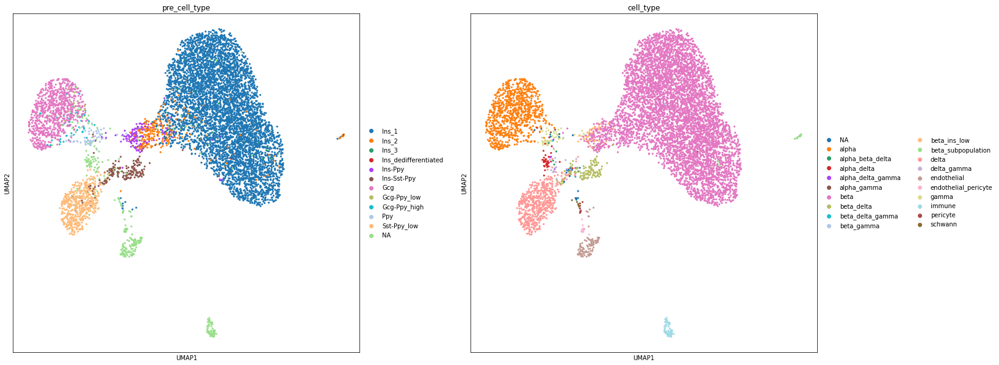

In [127]:
### Plot cell types on UMPA (pre-annotated and new ones)
rcParams['figure.figsize']=(10,10)
sc.pl.umap(adata_rawnormalised, color=['pre_cell_type','cell_type'], size=40, use_raw=False,wspace=0.2)

Cell type count:

In [128]:
# Count of new cell types
adata_rawnormalised.obs.cell_type.value_counts()

beta                    5713
alpha                    872
delta                    544
beta_delta               128
endothelial              108
immune                    60
gamma                     53
beta_ins_low              45
alpha_delta               39
beta_subpopulation        27
NA                        22
delta_gamma               16
endothelial_pericyte      14
pericyte                  13
alpha_beta_delta           6
schwann                    5
alpha_delta_gamma          5
alpha_gamma                3
beta_gamma                 3
beta_delta_gamma           2
Name: cell_type, dtype: int64

#### Mean marker expression across cell types

Text(0.5, 1.0, 'cell_type')

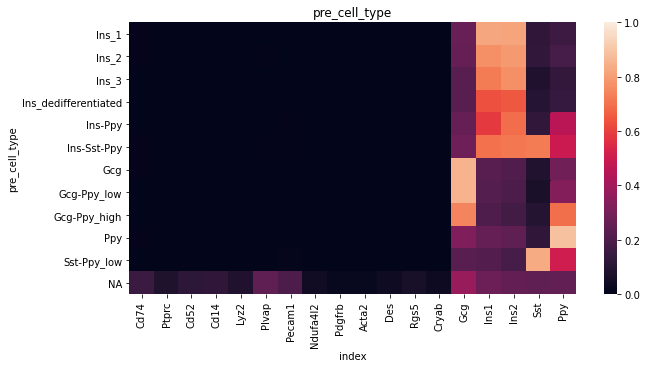

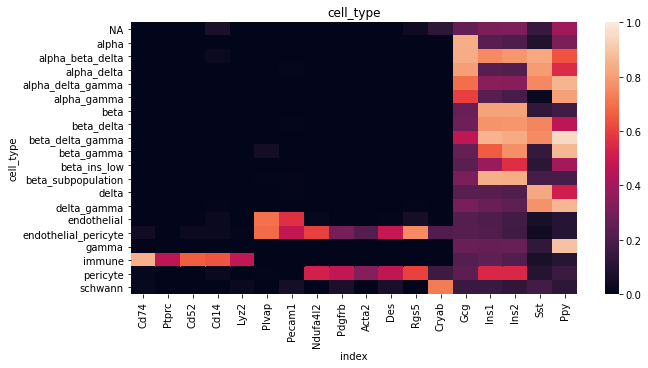

In [129]:
# Plot mean marker expression in each cell type - for preannotated and new types
rcParams['figure.figsize']=(10,5)
fig,ax=plt.subplots()
sb.heatmap(scaled_expression.groupby(adata_rawnormalised.obs['pre_cell_type']).mean(),yticklabels=1,xticklabels=1,
          vmin=0,vmax=1)
ax.set_title('pre_cell_type')
fig,ax=plt.subplots()
sb.heatmap(scaled_expression.groupby(adata_rawnormalised.obs['cell_type']).mean(),yticklabels=1,xticklabels=1,
           vmin=0,vmax=1)
ax.set_title('cell_type')

Expression of markers in individual NA cells.

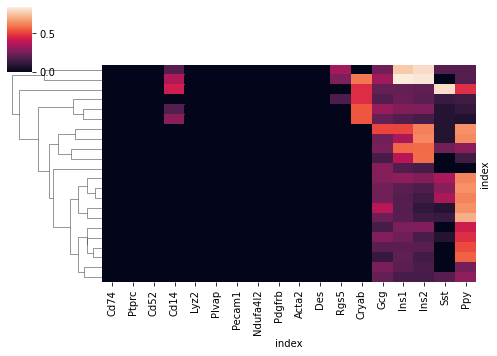

In [130]:
# Subset marker expression to NA cell type cells and plot heatmap
sb.clustermap(pd.DataFrame(scaled_expression[adata_rawnormalised.obs.cell_type=='NA']), 
                  row_cluster=True, col_cluster=False,xticklabels=1,yticklabels=False,figsize=(7,5))

#C: It is possible that more endothelial and shwann cells could be annotated. However, as schwann cells did not have its own cluster* and endothelial-like cells were not present in endothelial cluster they will be left as NA for now.

\* Possibly due to small number of cells - there is some indication of some schwann subclusters, but they could not be separated with leiden clustering.

#### QC metrics in each cell type.

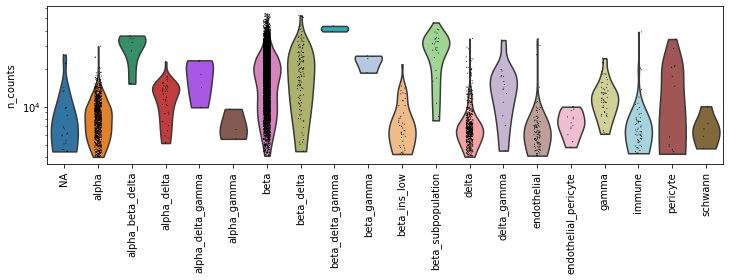

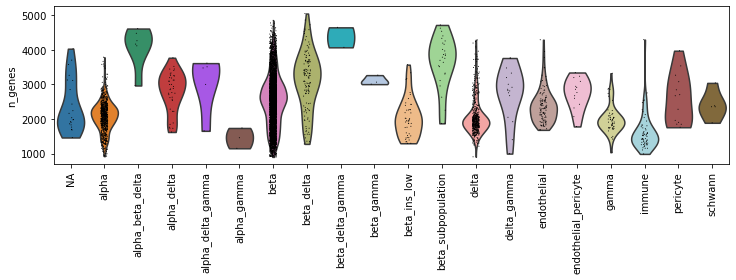

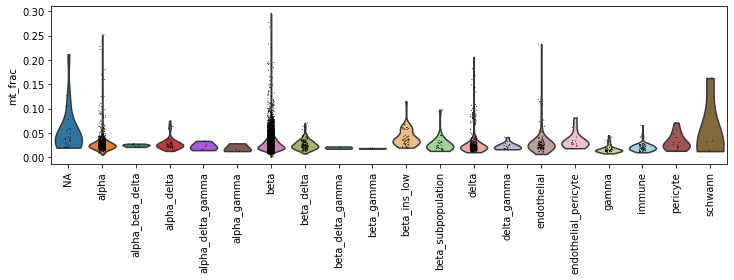

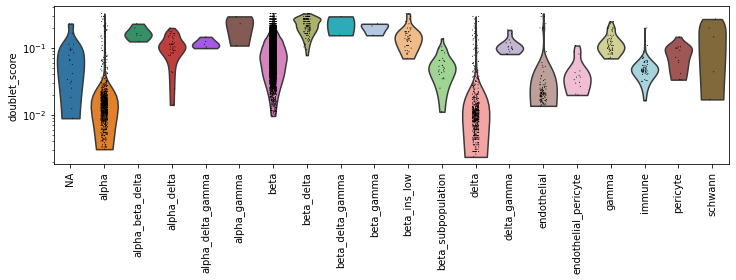

In [131]:
# QC metrics per cell type
# Code for adding info to adata is below
rcParams['figure.figsize']=(10,3)
sc.pl.violin(adata_rawnormalised, ['n_counts'], groupby='cell_type', size=1, log=True,rotation=90)
sc.pl.violin(adata_rawnormalised, ['n_genes'], groupby='cell_type', size=1, log=False,rotation=90)
sc.pl.violin(adata_rawnormalised, ['mt_frac'], groupby='cell_type', size=1, log=False,rotation=90)
sc.pl.violin(adata_rawnormalised, 'doublet_score',groupby='cell_type',size=1, log=True,rotation=90)

#C: Many of the mixed cell type populations have QC metrics that indicate doublets. As many of them are small in N cells identification of markers compared to original subpopulations is not reliable. For now this will be left as it is and considered latter in the analysis (e.g. in comparison to other datasets). 

#### Add annotation to original adata

In [132]:
# Add cell type to adata
adata.obs['cell_type']=adata_rawnormalised.obs.cell_type
# Add final clusters and starting clusters to adata
adata.obs[['cluster',clusters_col]]=adata_rawnormalised.obs[['cluster',clusters_col]]
# Add cell type scores
score_cols=[col for col in scores_df_norm.columns if '_score' in col]
adata.obs[score_cols]=scores_df_norm[score_cols].reindex(adata.obs.index)

#### Genes overexpressed in cell types

Upregulated genes in each cell type compared to other cells on normalised log scaled data. Exclude groups with size below 10 cells and NA annotation.

In [133]:
# Compute overexpressed genes in each cell type on normalised log scaled data
#Retain only cell types with >=10 cells and non-NA annotation
groups_counts=adata.obs.cell_type.value_counts()
groups=[cell_type for cell_type in groups_counts[groups_counts>=10].index if cell_type!='NA']
# Compute markers
sc.tl.rank_genes_groups(adata,groupby='cell_type',groups=groups, use_raw=False)
sc.tl.filter_rank_genes_groups(adata,groupby='cell_type', use_raw=False)

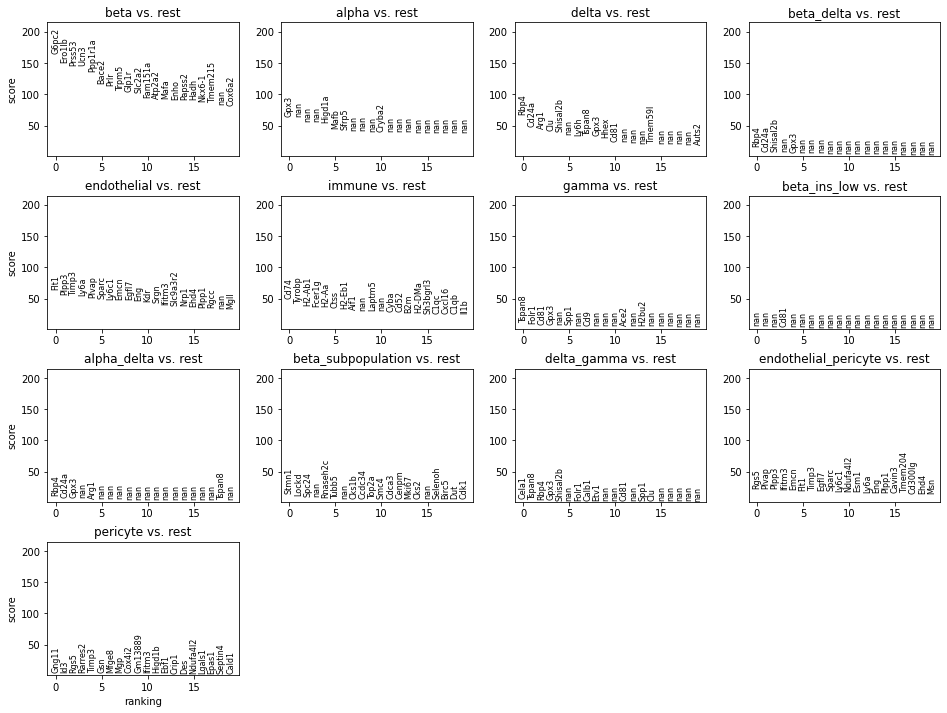

In [134]:
# Plot cell_type vs rest upregulated genes
rcParams['figure.figsize']=(4,3)
sc.pl.rank_genes_groups(adata,key='rank_genes_groups_filtered')

Expression of upregulated genes on normalised log transformed z-scaled data

categories: NA, alpha, alpha_beta_delta, etc.
var_group_labels: beta, alpha, delta, etc.


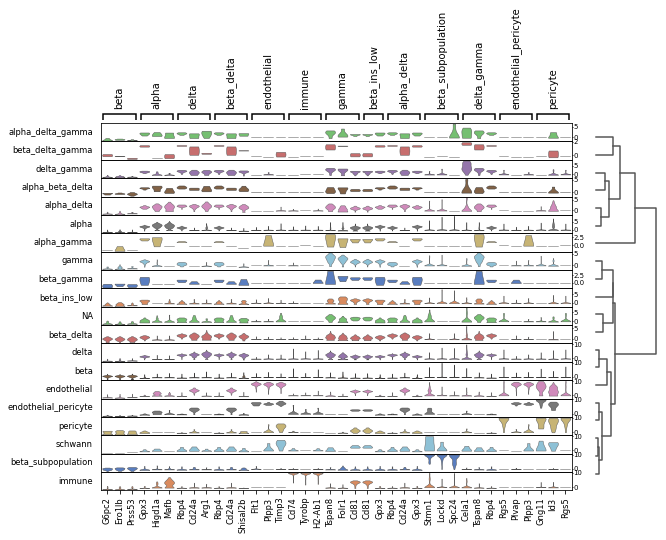

In [136]:
# Plot expression of cell type upregulated genes on normalised log transformed z-scaled data
adata_scl.uns['rank_genes_groups_filtered']=adata.uns['rank_genes_groups_filtered']
adata_scl.obs['cell_type']=adata.obs['cell_type']
sc.pl.rank_genes_groups_stacked_violin(adata_scl,key='rank_genes_groups_filtered',n_genes=3,use_raw=False)

### Expected doublet rates

Adapted from https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6126471/#ref-7, but using 0.1 as doublet rate (described in my notes).

Expected multiplet number is calculated for each file separately.

#C: A beta subpopulation (beta_subpopulation) is excluded from calculations as it groups away from other beta cells and multiplets.

In [40]:
# Singlet cell types whose multiplet rates are predicted
cell_types=['alpha','beta','gamma','delta']
# DFs with expected multiplet rates
expected_dfs=[]
# Calculate expected rate for each file separately
for file in adata.obs.file.unique():
    print('\nFile:',file)
    # Exclude some endocrine cells as they form completely separate populations 
    # with no multiplets in neighbourhood)
    exclude_types=['beta_subpopulation_STZref']
    cell_type_temp=adata.obs.query('file == "'+file+'" & cell_type not in @exclude_types').cell_type.copy()
    
    # N of droplets containing at least one cell of the relevant cell type
    Ns=dict()
    for cell_type in cell_types:
        n_celltype=cell_type_temp.str.contains(cell_type).sum()
        Ns[cell_type]=n_celltype
    print('N droplets that contain at least one:',Ns)
    
    # Calculate N (see formula in notes)
    N=emr.get_N(Ns=Ns.values())
    regex_any='|'.join(['.*'+cell_type+'.*' for cell_type in cell_types])
    print('N:',round(N,1), '(observed cell-containing N with relevant cell types:',
          cell_type_temp.str.contains(fr'{regex_any}').sum(),')')
    
    # Calculate mu for each cell type
    mus=dict()
    for cell_type in cell_types:
        mus[cell_type]=emr.mu_cell_type(N_cell_type=Ns[cell_type], N=N)
    print('mu:',{k:round(v,4) for k,v in mus.items()})
    
    # Extract multiplet types and their components
    multiplet_types=dict()
    for cell_type in cell_type_temp.unique():
        # Get components of multiplets by retaining name parts contained in original cell type dict
        components_all=cell_type.split('_')
        components_relevant=[type_singlet for type_singlet in components_all if type_singlet in cell_types]
        if len(components_relevant) > 1:
            multiplet_types[cell_type]=components_relevant
            # This does not assure that initially the cell types are not counted wrongly 
            # (e.g. including proliferative, ...)
            #if len(components_relevant) < len(components_all):
            #    warnings.warn('Multiplet type has additional unrecognised component: '+cell_type)
    #print('Relevant multiplet cell types:',multiplet_types.keys())
    
    # This also analyses O and E of singlet types, but this is not so relevant as changes in multiplets also 
    # affect it?
    #types_OE= dict(zip(cell_types,[[i] for i in cell_types]))
    #types_OE.update(multiplet_types)
    
    # Calculate O (observed) and E (expected) numbers
    expected_df=pd.DataFrame(index=multiplet_types.keys(),columns=['O_'+file,'E_'+file
                                                                  # ,'E_atleast'
                                                                  ])
    #for multiplet, components in types_OE.items():
    for multiplet, components in multiplet_types.items():
        absent=np.setdiff1d(cell_types,components)
        # N of cellls of this cell type
        expected_df.at[multiplet,'O_'+file]=(cell_type_temp==multiplet).sum()
        # Expected N of cells that have all the individual cell types of multiplet and non of the other 
        # considered possible multiplet ontributors
        expected_df.at[multiplet,'E_'+file]=emr.expected_multiplet(
            mu_present=[mus[cell_type] for cell_type in components], 
            mu_absent=[mus[cell_type] for cell_type in absent], 
            N=N)
        # E that droplet contains at least one cell of each present cell type,
        # but does not exclude other cell types from being present
        #expected_df.at[multiplet,'E_atleast']=emr.expected_multiplet(
        #    mu_present=[mus[cell_type] for cell_type in components], 
        #    mu_absent=[], 
        #    N=N)
    expected_dfs.append(expected_df)
    
# Merge O/E rates for all files into single DF
display(pd.concat(expected_dfs,axis=1))
del cell_type_temp


File: G1
N droplets that contain at least one: {'alpha': 925, 'beta': 5897, 'gamma': 82, 'delta': 740}
N: 16986.0 (observed cell-containing N with relevant cell types: 7429 )
mu: {'alpha': 0.056, 'beta': 0.4264, 'gamma': 0.0048, 'delta': 0.0445}


,O_G1,E_G1
beta_delta,128,241.741
delta_gamma,16,2.20514
alpha_delta,39,26.1807
alpha_delta_gamma,5,0.127
beta_gamma,3,25.7448
alpha_beta_delta,6,13.9225
alpha_gamma,3,2.78818
beta_delta_gamma,2,1.17266


#C: In Sachs 2020 (where this data is from) they did not count alpha_gamma, beta_delta_gamma, and beta_gamma as multiplets. However, they included much lower Ppy cells, thus having a larger population of these cells. As here only a few cells pof these ccell types are present (due to using only cells with gamma-like Ppy expression) they might be multiplets.

In [6]:
# Reassign cell types to multiplet
multiplets=['beta_delta','beta_gamma','alpha_beta_delta','alpha_gamma','beta_delta_gamma']
adata.obs['cell_type_multiplet']=adata.obs.cell_type.replace(multiplets, 'multiplet')

... storing 'cell_type' as categorical
... storing 'cell_type_multiplet' as categorical


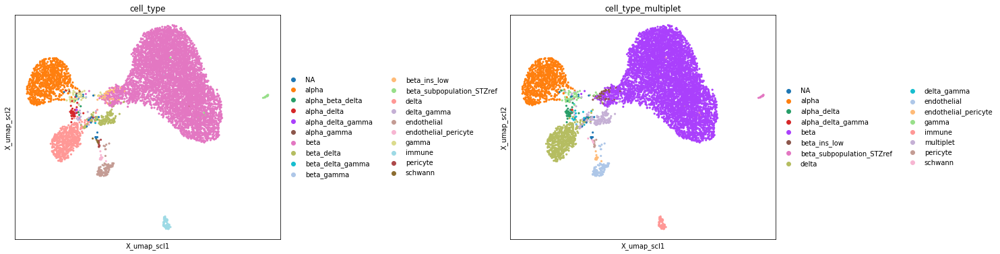

In [41]:
# Plot new cell types
rcParams['figure.figsize']=(6,6)
sc.pl.embedding(adata,'X_umap_scl', color=['cell_type','cell_type_multiplet'], size=40, use_raw=False,wspace=0.7)

## Resolve beta subtypes

#### Preprocess beta cell data

Select beta cells only

In [8]:
[ct for ct in adata.obs.cell_type_multiplet.unique() if 'beta' in ct]

['beta', 'beta_subpopulation_STZref', 'beta_ins_low']

#C: No beta str containing cell types to exclude

In [8]:
# Subset adata
selected_beta=[ct for ct in adata.obs.cell_type_multiplet.unique() if 'beta' in ct]
adata_beta=adata[adata.obs.cell_type.isin(selected_beta),:].copy()
adata_beta.shape

# Normalise raw data for plotting and cell type scoring
adata_raw_beta=adata_beta.raw.to_adata().copy()
# Normalize and log transform
adata_raw_beta.X /= adata_raw_beta.obs['size_factors'].values[:,None] # This reshapes the size-factors array
sc.pp.log1p(adata_raw_beta)
adata_raw_beta.X = sparse.csr_matrix(np.asarray(adata_raw_beta.X))

# Scale beta adata for umap
adata_scl_beta=adata_beta
del adata_beta
sc.pp.scale(adata_scl_beta,max_value=10)
sc.pp.pca(adata_scl_beta, n_comps=10, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata_scl_beta,n_pcs=10)
sc.tl.umap(adata_scl_beta)

# Combine raw and X data
adata_rawnormalised_beta=adata_scl_beta.copy()
adata_rawnormalised_beta.raw=adata_raw_beta
del adata_raw_beta

/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/scanpy/neighbors/__init__.py:121: FutureWarning: This location for 'distances' is deprecated. It has been moved to .obsp[distances], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['distances'] = neighbors.distances
/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/scanpy/neighbors/__init__.py:122: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'] = neighbors.connectivities
/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/scanpy/tools/_umap.py:147: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'

#### Check markers

('beta', '/')
Missing genes: []


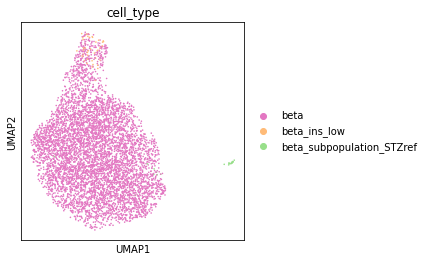

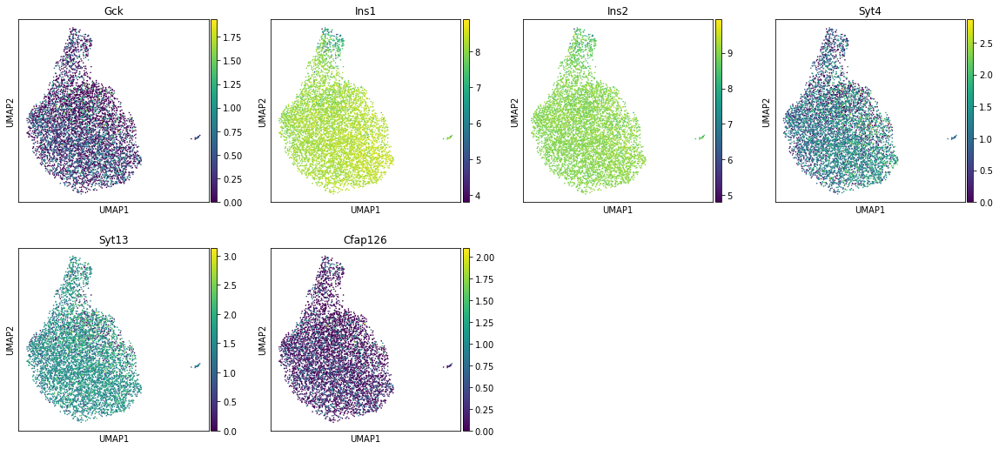

('beta', 'aging')
Missing genes: []


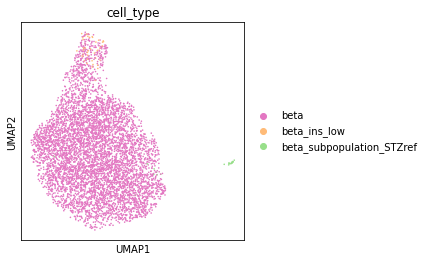

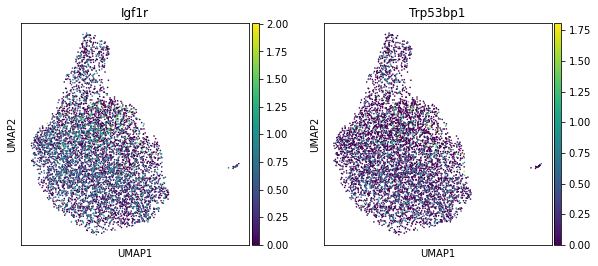

('beta', 'dedifferentiated')
Missing genes: []


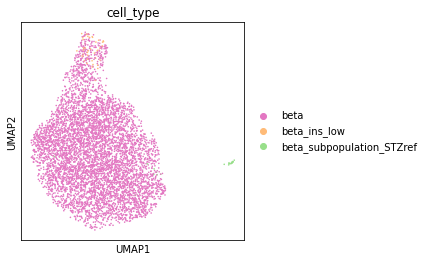

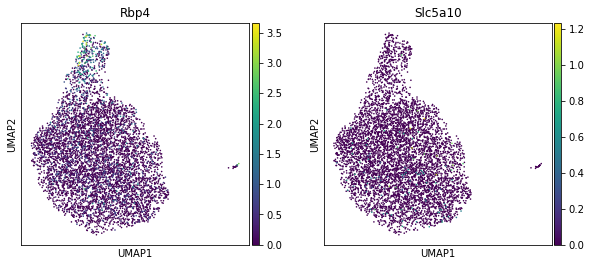

('beta', 'disease')
Missing genes: []


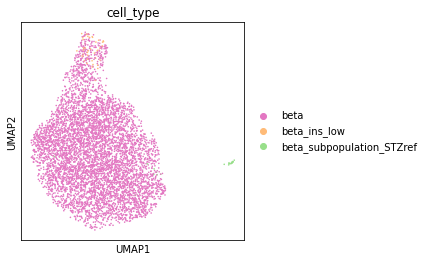

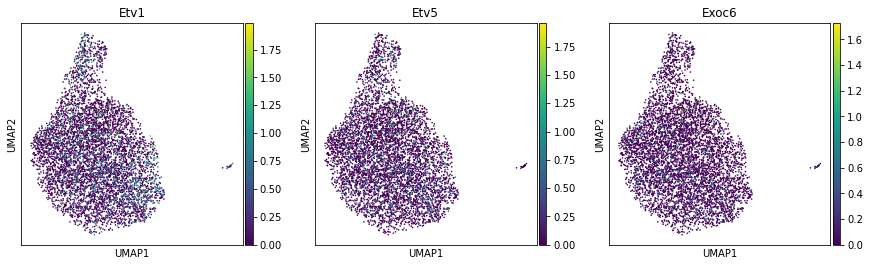

('beta', 'immature')
Missing genes: ['Pax4']


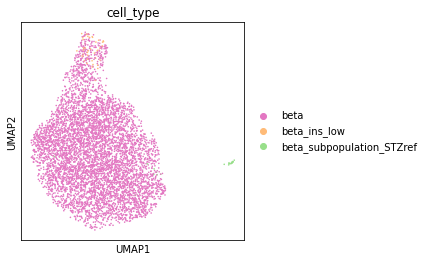

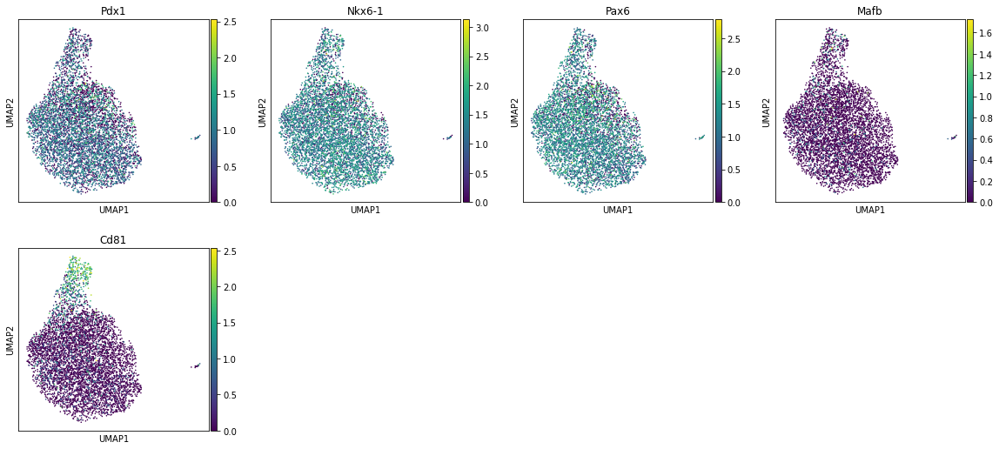

('beta', 'inflamation')
Missing genes: []


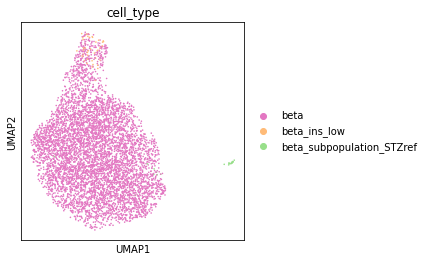

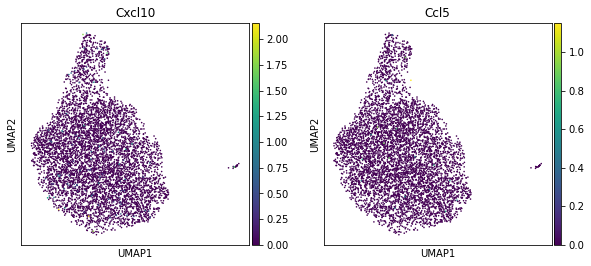

('beta', 'mature')
Missing genes: []


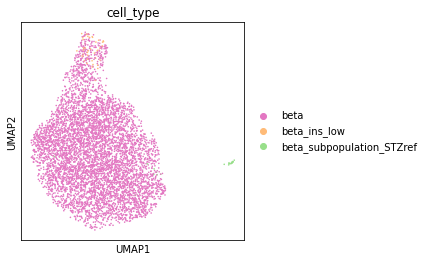

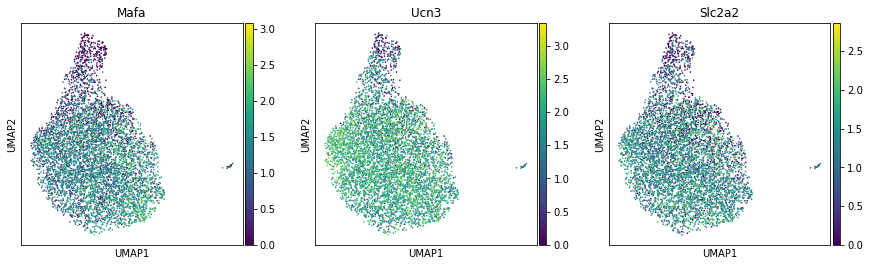

('beta', 'senescent')
Missing genes: []


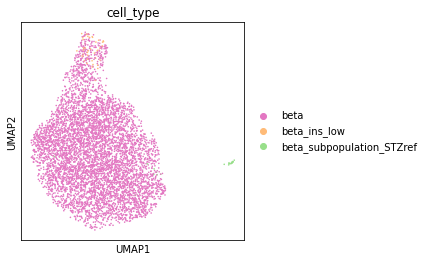

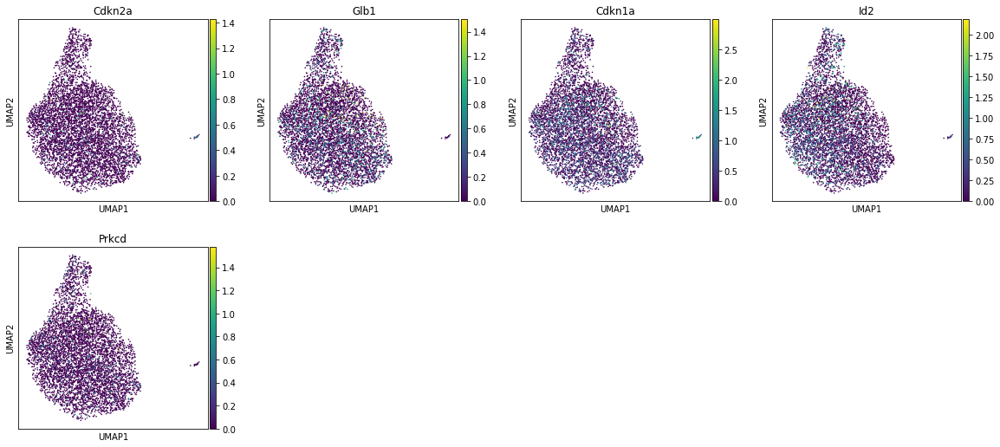

('endocrine', '/')
Missing genes: ['Neurod2']


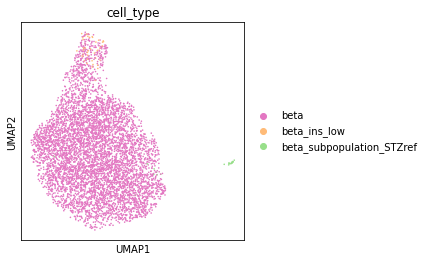

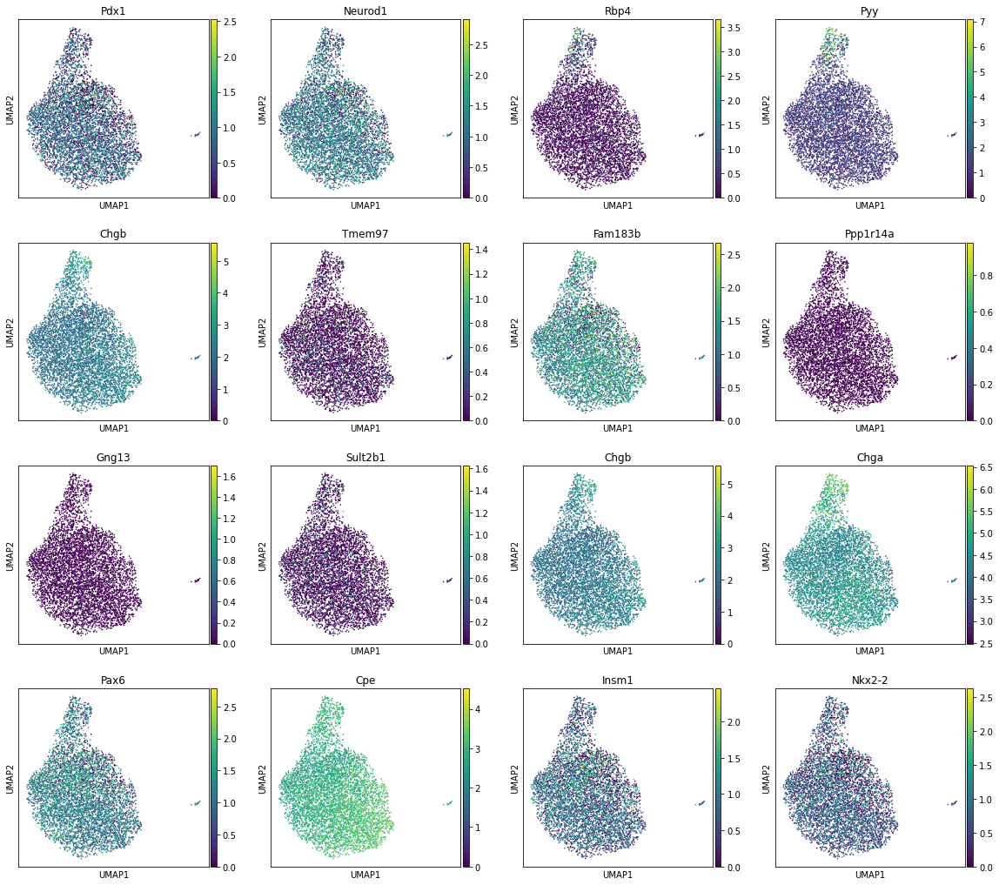

In [10]:
# Select beta and endocrine markers and group by cell type and subtype
for group_name, group in markers.query('Cell in ["beta","endocrine"]').fillna('/').groupby(['Cell','Subtype']):
    print(group_name)
    genes=group.Gene
    # Retain genes present in raw var_names
    missing=[gene for gene in genes if gene not in adata.raw.var_names]
    genes=[gene for gene in genes if gene in adata.raw.var_names]
    print('Missing genes:',missing)
    rcParams['figure.figsize']=(4,4)
    sc.pl.umap(adata_rawnormalised_beta, color=['cell_type'],size=10, use_raw=True)
    sc.pl.umap(adata_rawnormalised_beta, color=genes ,size=10, use_raw=True)

#C: Subpopulations: ins low (immature), immature, Cd81 high.

In [9]:
# Selected markers that seem to be able to distinguish between cell seubtypes
markers_selection_beta={
'Cd81_high':['Cd81'],
'mature':['Mafa','Ucn3','Slc2a2'],
'immature':['Rbp4','Pyy'],
'ins_high':['Ins1','Ins2']
}

#### Calculate subpopulation scores

In [10]:
# Calculate scores
scores=[]
for cell_type,genes in markers_selection_beta.items():
    score_name=cell_type+'_score'
    scores.append(cell_type+'_score')
    sc.tl.score_genes(adata_rawnormalised_beta, gene_list=genes, score_name=score_name,  use_raw=True)

In [11]:
# Scores normalised to interval [0,1] for each cell type - so that they can be more easily compared
scores_df_norm_beta=adata_rawnormalised_beta.obs[scores]
scores_df_norm_beta=pd.DataFrame(pp.minmax_scale(scores_df_norm_beta),columns=scores_df_norm_beta.columns,index=adata_rawnormalised_beta.obs.index)

#### Score distn and relationships

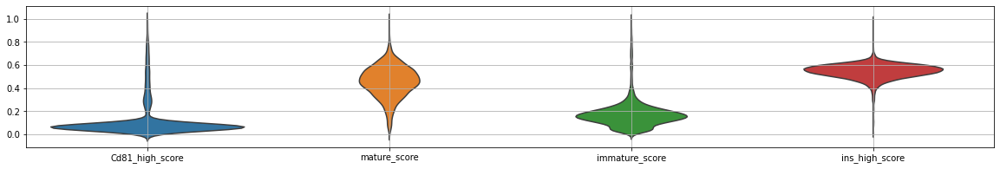

In [12]:
# Plot of normalised scores distribution in whole dataset, per cluster
rcParams['figure.figsize']=(20,3)
fig,ax=plt.subplots()
sb.violinplot(data=scores_df_norm_beta,inner=None,ax=ax)
ax.grid()

In [47]:
# Convert ins high to ins low
scores_df_norm_beta['ins_low_score']=scores_df_norm_beta['ins_high_score']*-1+1

In [48]:
# Dict for score thresholds
beta_marker_thresholds=dict()

Text(0, 0.5, 'mature_score')

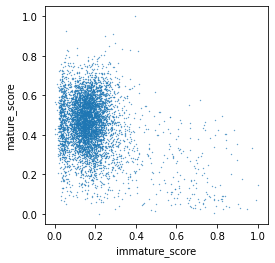

In [49]:
# Find immature
rcParams['figure.figsize']=(4,4)
plt.scatter(scores_df_norm_beta['immature_score'],scores_df_norm_beta['mature_score'],s=0.1)
plt.xlabel('immature_score')
plt.ylabel('mature_score')

Dist of differences between mature and immature

In [50]:
scores_df_norm_beta['immature-mature_score']=scores_df_norm_beta['immature_score']-scores_df_norm_beta['mature_score']

Text(0.5, 0, 'immature-mature score')

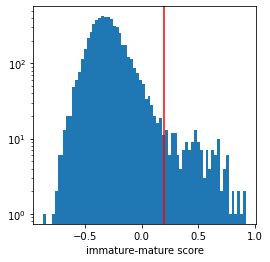

In [54]:
a=plt.hist(scores_df_norm_beta['immature-mature_score'],bins=70)
plt.yscale('log')
beta_marker_thresholds['immature-mature_score']=0.2
plt.axvline(beta_marker_thresholds['immature-mature_score'],c='r')
plt.xlabel('immature-mature score')

Text(0, 0.5, 'mature_score')

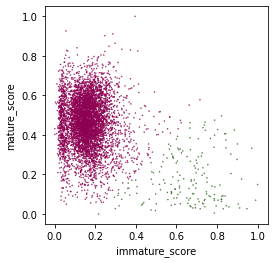

In [55]:
plt.scatter(scores_df_norm_beta['immature_score'],scores_df_norm_beta['mature_score'],s=0.2,
            c=scores_df_norm_beta['immature-mature_score']>=beta_marker_thresholds['immature-mature_score'],
            cmap='PiYG')
plt.xlabel('immature_score')
plt.ylabel('mature_score')

Text(0, 0.5, 'immature-mature_score')

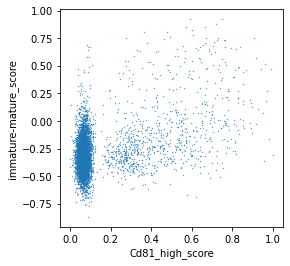

In [56]:
plt.scatter(scores_df_norm_beta['Cd81_high_score'],scores_df_norm_beta['immature-mature_score'],s=0.1)
plt.xlabel('Cd81_high_score')
plt.ylabel('immature-mature_score')

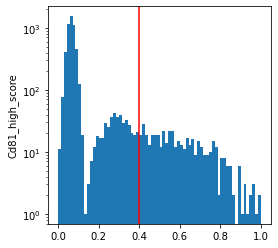

In [57]:
a=plt.hist(scores_df_norm_beta['Cd81_high_score'],bins=70)
plt.yscale('log')
plt.ylabel('Cd81_high_score')
beta_marker_thresholds['Cd81_high_score']=0.4
plt.axvline(beta_marker_thresholds['Cd81_high_score'],c='r')

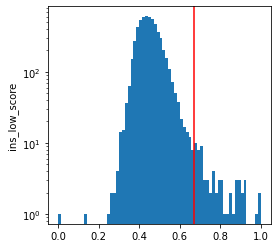

In [58]:
a=plt.hist(scores_df_norm_beta['ins_low_score'],bins=70)
plt.yscale('log')
plt.ylabel('ins_low_score')
beta_marker_thresholds['ins_low_score']=0.67
plt.axvline(beta_marker_thresholds['ins_low_score'],c='r')

Text(0, 0.5, 'immature-mature_score')

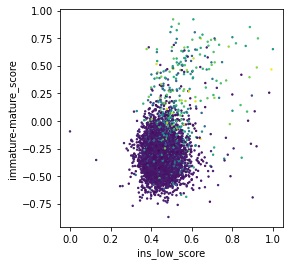

In [43]:
plt.scatter(scores_df_norm_beta['ins_low_score'],scores_df_norm_beta['immature-mature_score'],s=2,
           c=scores_df_norm_beta['Cd81_high_score'])
plt.xlabel('ins_low_score')
plt.ylabel('immature-mature_score')

In [59]:
# Thresholds for cell type assignemnt based on normalised scores
scores_cols_beta=['immature-mature_score','Cd81_high_score','ins_low_score']
thresholds_beta=[beta_marker_thresholds[score_col] for score_col in scores_cols_beta]

In [60]:
# Assign cell types based on scores to each cell
assignment_df_beta=scores_df_norm_beta[scores_cols_beta]>=thresholds_beta
# replace '-mature' from immature-mature to get just immature out for the cell type name
assignment_df_beta.columns=[col.replace('_score','').replace('-mature','') for col in scores_cols_beta] 

In [61]:
# For each cell make a (standard) string of annotated cell types: 
# e.g. each annotated cell type in the same order, separated by '_' when multiple cell types were annotated
type_unions_beta=[]
for idx,row in assignment_df_beta.iterrows():
    type_union=''
    for col in row.index:
        # Remove Ccl5 from union of cell types
        if row[col]:
            type_union=type_union+col+'_'
    if type_union=='':
        type_union='NA'
    type_unions_beta.append(type_union.rstrip('_'))

In [62]:
# Add cell types strings of cells to scores/assignment DF
assignment_df_beta['type_union']=type_unions_beta
assignment_df_beta['type_union'].value_counts()

NA                            5243
Cd81_high                      342
immature_Cd81_high              88
immature                        46
immature_Cd81_high_ins_low      28
ins_low                         19
immature_ins_low                10
Cd81_high_ins_low                9
Name: type_union, dtype: int64

In [63]:
adata_rawnormalised_beta.obs['beta_subtype']=assignment_df_beta['type_union']

... storing 'beta_subtype' as categorical


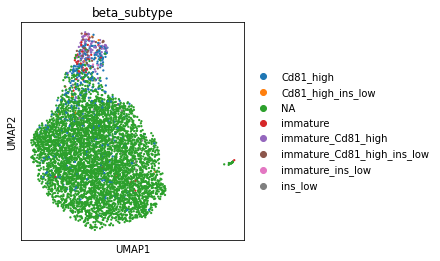

In [64]:
rcParams['figure.figsize']=(4,4)
sc.pl.umap(adata_rawnormalised_beta,color='beta_subtype')

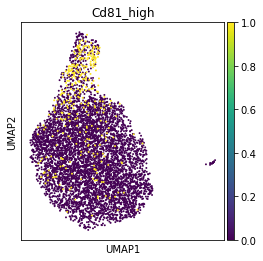

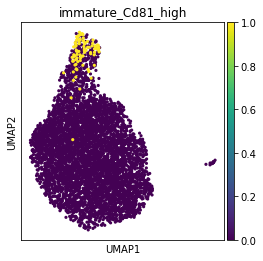

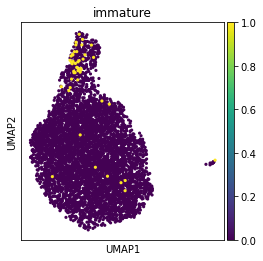

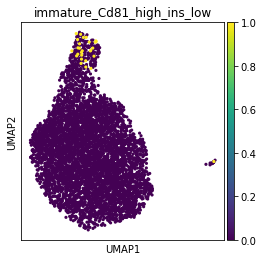

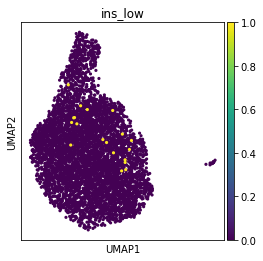

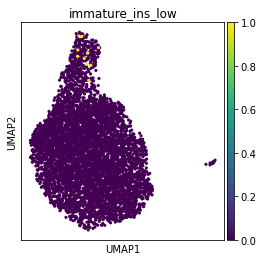

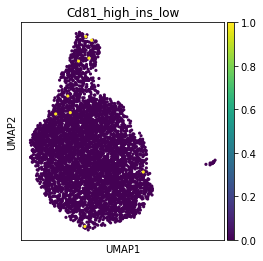

In [65]:
for subtype,count in adata_rawnormalised_beta.obs.beta_subtype.value_counts().iteritems():
    if subtype !='NA':
        s=40 if count < 100 else 15
        adata_rawnormalised_beta.obs['temp']=adata_rawnormalised_beta.obs['beta_subtype']==subtype
        sc.pl.umap(adata_rawnormalised_beta,color='temp',size=s,title=subtype)
adata_rawnormalised_beta.obs.drop('temp',axis=1,inplace=True)

In [67]:
# rename cell types
adata_rawnormalised_beta.obs['beta_subtype'].replace({
    'immature_Cd81_high':'immature',
    'immature_Cd81_high_ins_low':'immature_ins_low',
    'Cd81_high_ins_low':'Cd81_high'
}, inplace=True)

In [68]:
adata_rawnormalised_beta.obs.beta_subtype.value_counts()

NA                  5243
Cd81_high            351
immature             134
immature_ins_low      38
ins_low               19
Name: beta_subtype, dtype: int64

... storing 'beta_subtype' as categorical


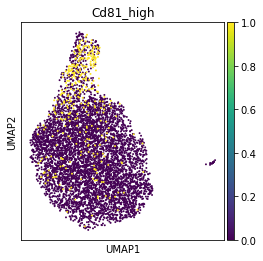

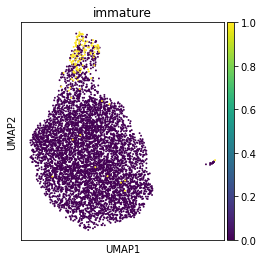

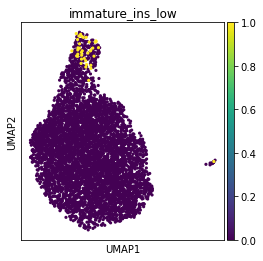

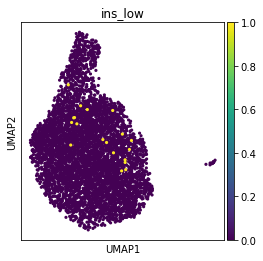

In [69]:
for subtype,count in adata_rawnormalised_beta.obs.beta_subtype.value_counts().iteritems():
    if subtype !='NA':
        s=40 if count < 100 else 15
        adata_rawnormalised_beta.obs['temp']=adata_rawnormalised_beta.obs['beta_subtype']==subtype
        sc.pl.umap(adata_rawnormalised_beta,color='temp',size=s,title=subtype)
adata_rawnormalised_beta.obs.drop('temp',axis=1,inplace=True)

In [70]:
# Add cell type data to adata
adata.obs[['cell_subtype','cell_subtype_multiplet']]=adata.obs[['cell_type','cell_type_multiplet']]
for subtype in adata_rawnormalised_beta.obs['beta_subtype'].unique():
    if subtype != 'NA':
        idxs=adata_rawnormalised_beta.obs.query('beta_subtype == @subtype').index
        subtype='beta_'+subtype
        add_category(df=adata.obs,idxs=idxs,col='cell_subtype',category=subtype)
        add_category(df=adata.obs,idxs=idxs,col='cell_subtype_multiplet',category=subtype)
# reorder categories
adata.obs.cell_subtype=pd.Categorical(adata.obs.cell_subtype,
                                   categories=sorted(list(adata.obs.cell_subtype.unique())),ordered=True)
adata.obs.cell_subtype_multiplet=pd.Categorical(adata.obs.cell_subtype_multiplet,
                                  categories=sorted(list(adata.obs.cell_subtype_multiplet.unique())),ordered=True)

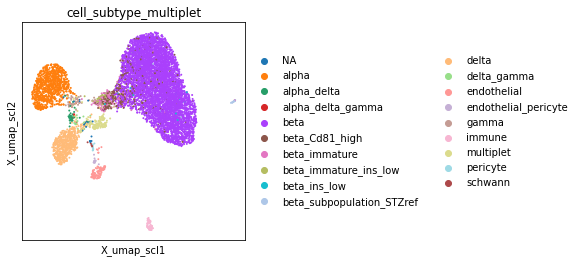

In [71]:
sc.pl.embedding(adata,'X_umap_scl',color='cell_subtype_multiplet')

### Save annotation

In [72]:
if SAVE:
    h.save_h5ad(adata, shared_folder+"data_annotated.h5ad",unique_id2=UID2)

In [7]:
#adata=h.open_h5ad(shared_folder+"data_annotated.h5ad",unique_id2=UID2)